# Importing The Basic Libraries

In [1]:
import pandas as pd
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
pd.set_option('display.float_format',lambda x:'%.3f' %x)
import numpy as np

import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

import sklearn
import scipy.stats as stats

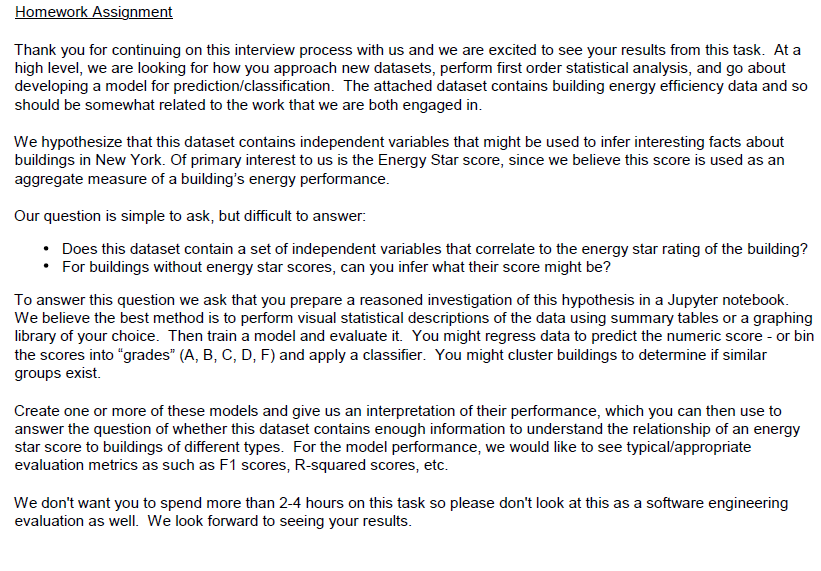

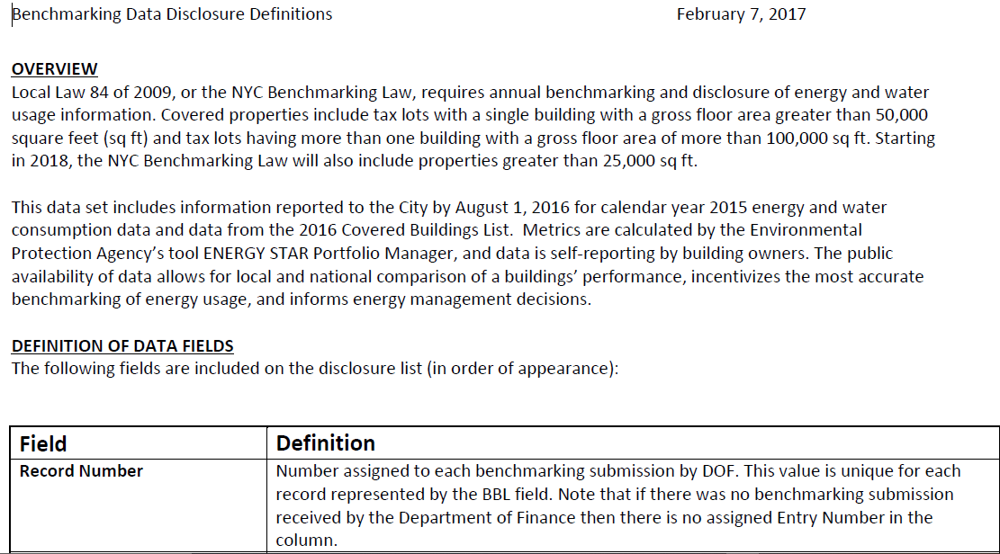

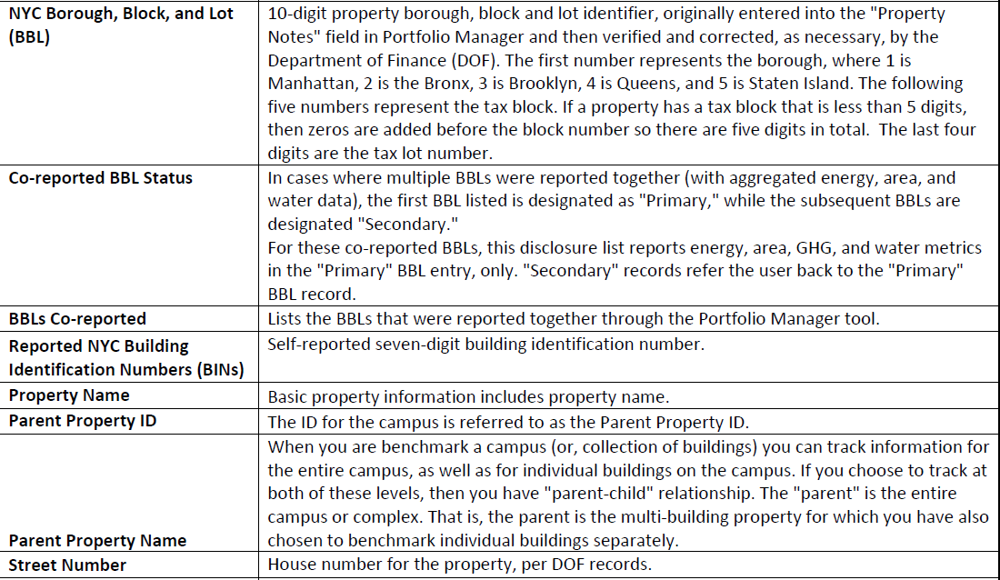

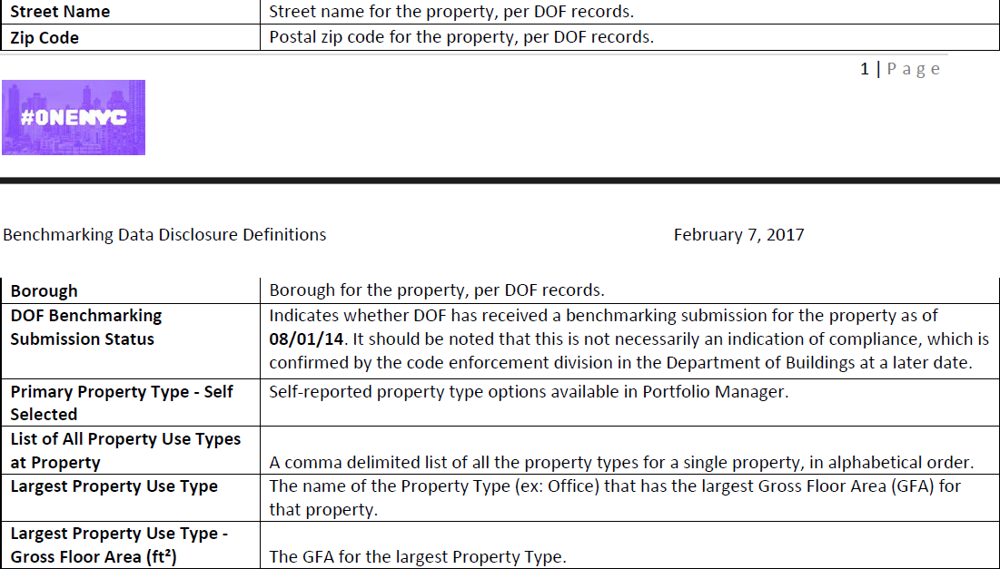

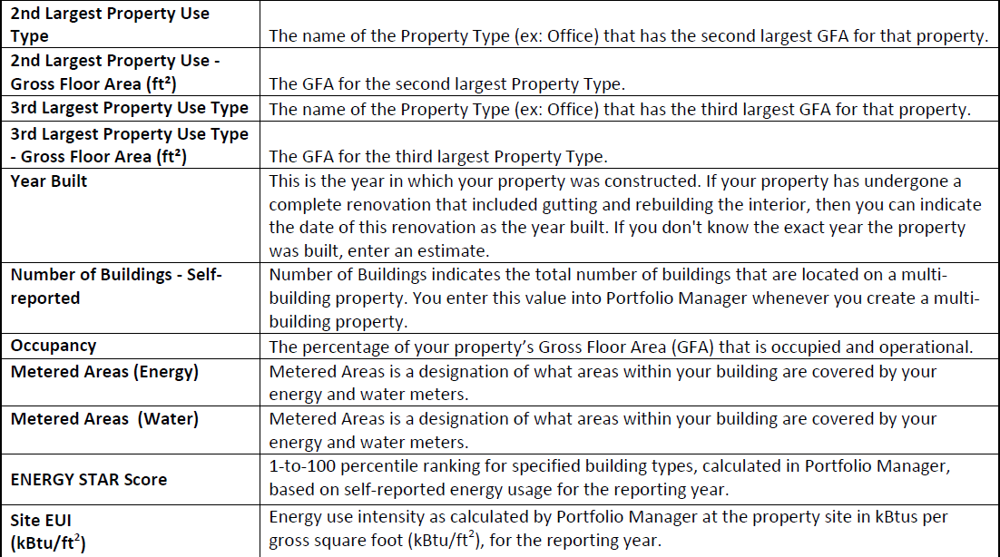

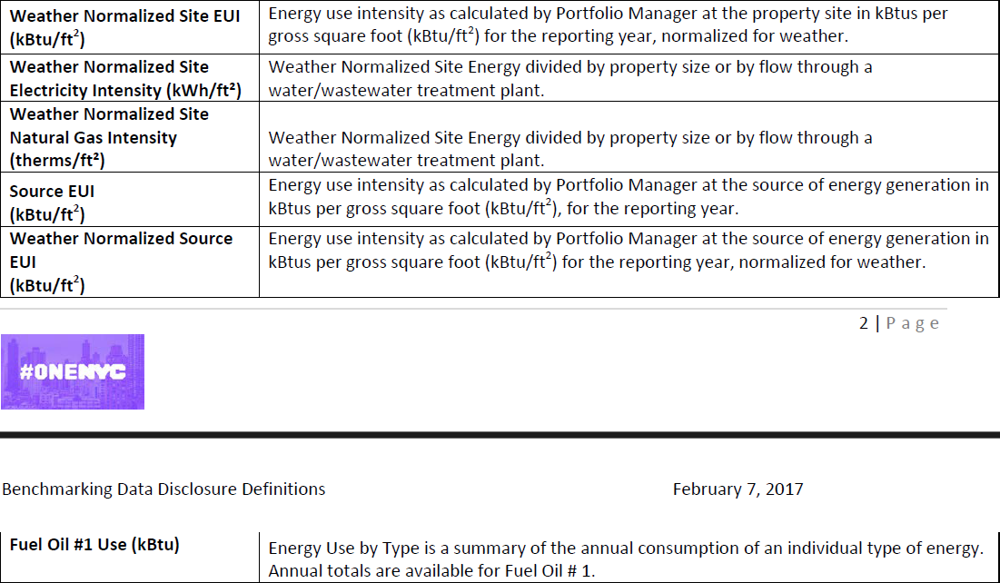

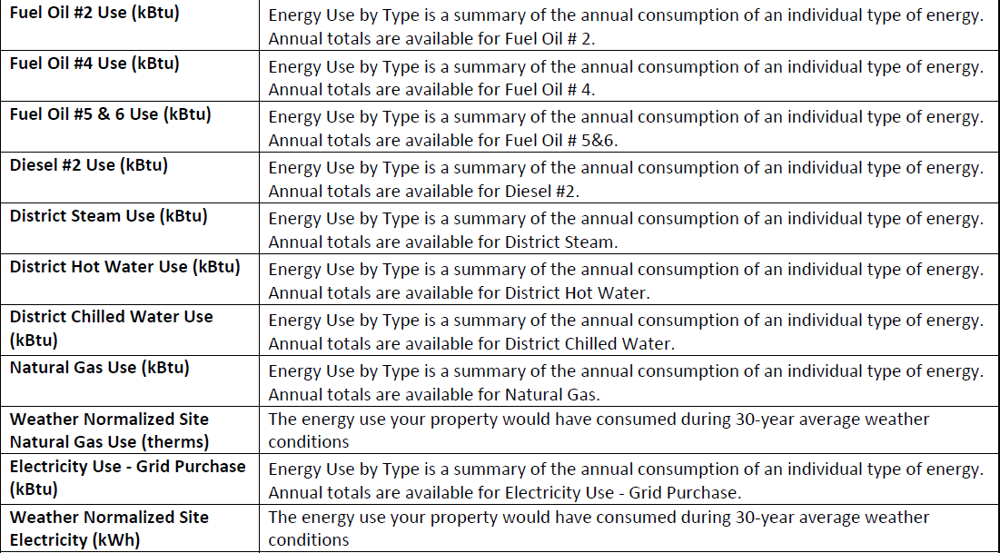

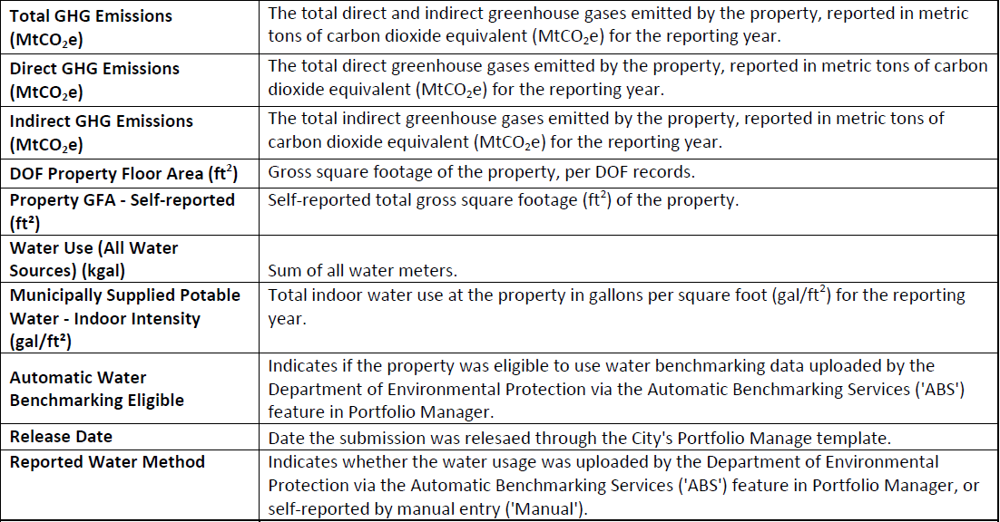

In [2]:
energy_star_df = pd.read_csv('Energy_and_Water_Data_Disclosure_for_Local_Law_84_2017__Data_for_Calendar_Year_2016_.csv')
df = energy_star_df.copy()

In [3]:
df.head(3)

,Order,Property Id,Property Name,Parent Property Id,Parent Property Name,BBL - 10 digits,"NYC Borough, Block and Lot (BBL) self-reported",NYC Building Identification Number (BIN),Address 1 (self-reported),Address 2,Postal Code,Street Number,Street Name,Borough,DOF Gross Floor Area,Primary Property Type - Self Selected,List of All Property Use Types at Property,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),2nd Largest Property Use Type,2nd Largest Property Use - Gross Floor Area (ft²),3rd Largest Property Use Type,3rd Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),ENERGY STAR Score,Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Fuel Oil #1 Use (kBtu),Fuel Oil #2 Use (kBtu),Fuel Oil #4 Use (kBtu),Fuel Oil #5 & 6 Use (kBtu),Diesel #2 Use (kBtu),District Steam Use (kBtu),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Release Date,Water Required?,DOF Benchmarking Submission Status,Latitude,Longitude,Community Board,Council District,Census Tract,NTA
0,1,13286,201/205,13286,201/205,1013160001,1013160001,1037549,201/205 East 42nd st.,Not Available,10017,675,3 AVENUE,Manhattan,289356.000,Office,Office,Office,293447,Not Available,Not Available,Not Available,Not Available,1963,2,100,Whole Building,Not Available,Not Available,305.6,303.1,37.8,Not Available,614.2,Not Available,Not Available,Not Available,Not Available,Not Available,5.15506751E7,Not Available,Not Available,38139374.2,1.10827705E7,6962.2,0,6962.2,762051,Not Available,Not Available,619.4,05/01/2017 05:32:03 PM,No,In Compliance,40.751,-73.974,6.000,4.000,88.000,Turtle Bay-East Midtown ...
1,2,28400,NYP Columbia (West Campus),28400,NYP Columbia (West Campus),1021380040,1-02138-0040,1084198; 1084387;1084385; 1084386; 1084388; 10...,622 168th Street,Not Available,10032,180,FT WASHINGTON AVENUE,Manhattan,3693539.000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),3889181,Not Available,Not Available,Not Available,Not Available,1969,12,100,Whole Building,Whole Building,55,229.8,228.8,24.8,2.4,401.1,Not Available,1.96248472E7,Not Available,Not Available,Not Available,-3.914148026E8,933073441,9330734.4,332365924,9.62613121E7,55870.4,51016.4,4854.1,3889181,Not Available,Not Available,404.3,04/27/2017 11:23:27 AM,No,In Compliance,40.841,-73.943,12.000,10.000,251.000,Washington Heights South ...
2,3,4778226,MSCHoNY North,28400,NYP Columbia (West Campus),1021380030,1-02138-0030,1063380,3975 Broadway,Not Available,10032,3975,BROADWAY,Manhattan,152765.000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),231342,Not Available,Not Available,Not Available,Not Available,1924,1,100,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,0,0,0,231342,Not Available,Not Available,Not Available,04/27/2017 11:23:27 AM,No,In Compliance,40.840,-73.940,12.000,10.000,251.000,Washington Heights South ...


In [4]:
# Before
print(f'Data frame has {energy_star_df.shape[0]} number of rows and {energy_star_df.shape[1]} number of columns present in data set.')

Data frame has 11746 number of rows and 60 number of columns present in data set.


In [5]:
unwanted_columns = ['Order',   'Property Id',   'Property Name',    'Parent Property Id',   'Parent Property Name',
                   'BBL - 10 digits',   'NYC Borough, Block and Lot (BBL) self-reported',
                    'NYC Building Identification Number (BIN)',      'Address 1 (self-reported)',
                     'Address 2',    'Postal Code',    'Street Number',    'Street Name','Borough','Release Date',
                   'NTA']

In [6]:
df.drop(columns=unwanted_columns,axis=1,inplace=True)

In [7]:
df.describe()

,DOF Gross Floor Area,Year Built,Number of Buildings - Self-reported,Occupancy,Property GFA - Self-Reported (ft²),Latitude,Longitude,Community Board,Council District,Census Tract
count,11628.000,11746.000,11746.000,11746.000,11746.000,9483.000,9483.000,9483.000,9483.000,9483.000
mean,173269.454,1948.738,1.290,98.763,167373.902,40.754,-73.957,7.141,15.771,4977.597
std,336705.455,30.576,4.017,7.502,318923.760,0.080,0.046,3.954,15.674,13520.423
min,50028.000,1600.000,0.000,0.000,0.000,40.516,-74.244,1.000,1.000,1.000
25%,65240.000,1927.000,1.000,100.000,66994.000,40.707,-73.985,4.000,4.000,100.000
50%,93138.500,1941.000,1.000,100.000,94080.000,40.759,-73.963,7.000,9.000,201.000
75%,159614.000,1966.000,1.000,100.000,158414.000,40.818,-73.932,9.000,33.000,531.500
max,13540113.000,2019.000,161.000,100.000,14217119.000,40.913,-73.716,56.000,51.000,155101.000


In [8]:
df.describe(include='object')

,Primary Property Type - Self Selected,List of All Property Use Types at Property,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),2nd Largest Property Use Type,2nd Largest Property Use - Gross Floor Area (ft²),3rd Largest Property Use Type,3rd Largest Property Use Type - Gross Floor Area (ft²),Metered Areas (Energy),Metered Areas (Water),ENERGY STAR Score,Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Fuel Oil #1 Use (kBtu),Fuel Oil #2 Use (kBtu),Fuel Oil #4 Use (kBtu),Fuel Oil #5 & 6 Use (kBtu),Diesel #2 Use (kBtu),District Steam Use (kBtu),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Water Required?,DOF Benchmarking Submission Status
count,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11628,11716
unique,55,813,54,9484,59,2264,50,964,8,7,101,1959,1944,441,66,2795,10,1906,1180,259,15,927,10155,9632,11406,10879,7818,5968,5853,7230,5607,2920,2,1
top,Multifamily Housing,Multifamily Housing,Multifamily Housing,70000,Not Available,Not Available,Not Available,Not Available,Whole Building,Whole Building,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,0,0,0,Not Available,Not Available,Not Available,Yes,In Compliance
freq,8688,6182,8694,61,8005,8005,10262,10262,11648,7111,2104,163,1465,787,1963,1465,11737,9165,10425,11152,11730,10810,1442,1962,244,786,108,892,194,3984,3984,163,7552,11716


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11746 entries, 0 to 11745
Data columns (total 44 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   DOF Gross Floor Area                                        11628 non-null  float64
 1   Primary Property Type - Self Selected                       11746 non-null  object 
 2   List of All Property Use Types at Property                  11746 non-null  object 
 3   Largest Property Use Type                                   11746 non-null  object 
 4   Largest Property Use Type - Gross Floor Area (ft²)          11746 non-null  object 
 5   2nd Largest Property Use Type                               11746 non-null  object 
 6   2nd Largest Property Use - Gross Floor Area (ft²)           11746 non-null  object 
 7   3rd Largest Property Use Type                               11746 non-null  object 
 

In [10]:
# To check messing values present in the data set.
df.isna().sum()/len(df)*100

DOF Gross Floor Area                                          1.005
Primary Property Type - Self Selected                         0.000
List of All Property Use Types at Property                    0.000
Largest Property Use Type                                     0.000
Largest Property Use Type - Gross Floor Area (ft²)            0.000
2nd Largest Property Use Type                                 0.000
2nd Largest Property Use - Gross Floor Area (ft²)             0.000
3rd Largest Property Use Type                                 0.000
3rd Largest Property Use Type - Gross Floor Area (ft²)        0.000
Year Built                                                    0.000
Number of Buildings - Self-reported                           0.000
Occupancy                                                     0.000
Metered Areas (Energy)                                        0.000
Metered Areas  (Water)                                        0.000
ENERGY STAR Score                               

# Data Cleaning Process

In [11]:
# removing leading and tralinig spaces in columns 
df.columns = df.columns.str.strip()

In [12]:
# replacing the '-' with ''
df.columns = df.columns.str.replace('-','')

In [13]:
# replacing the space with '_'
df.columns = df.columns.str.replace(' ','_')

In [14]:
df.head()

,DOF_Gross_Floor_Area,Primary_Property_Type__Self_Selected,List_of_All_Property_Use_Types_at_Property,Largest_Property_Use_Type,Largest_Property_Use_Type__Gross_Floor_Area_(ft²),2nd_Largest_Property_Use_Type,2nd_Largest_Property_Use__Gross_Floor_Area_(ft²),3rd_Largest_Property_Use_Type,3rd_Largest_Property_Use_Type__Gross_Floor_Area_(ft²),Year_Built,Number_of_Buildings__Selfreported,Occupancy,Metered_Areas_(Energy),Metered_Areas__(Water),ENERGY_STAR_Score,Site_EUI_(kBtu/ft²),Weather_Normalized_Site_EUI_(kBtu/ft²),Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²),Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²),Weather_Normalized_Source_EUI_(kBtu/ft²),Fuel_Oil_#1_Use_(kBtu),Fuel_Oil_#2_Use_(kBtu),Fuel_Oil_#4_Use_(kBtu),Fuel_Oil_#5_&_6_Use_(kBtu),Diesel_#2_Use_(kBtu),District_Steam_Use_(kBtu),Natural_Gas_Use_(kBtu),Weather_Normalized_Site_Natural_Gas_Use_(therms),Electricity_Use__Grid_Purchase_(kBtu),Weather_Normalized_Site_Electricity_(kWh),Total_GHG_Emissions_(Metric_Tons_CO2e),Direct_GHG_Emissions_(Metric_Tons_CO2e),Indirect_GHG_Emissions_(Metric_Tons_CO2e),Property_GFA__SelfReported_(ft²),Water_Use_(All_Water_Sources)_(kgal),Water_Intensity_(All_Water_Sources)_(gal/ft²),Source_EUI_(kBtu/ft²),Water_Required?,DOF_Benchmarking_Submission_Status,Latitude,Longitude,Community_Board,Council_District,Census_Tract
0,289356.000,Office,Office,Office,293447,Not Available,Not Available,Not Available,Not Available,1963,2,100,Whole Building,Not Available,Not Available,305.6,303.1,37.8,Not Available,614.2,Not Available,Not Available,Not Available,Not Available,Not Available,5.15506751E7,Not Available,Not Available,38139374.2,1.10827705E7,6962.2,0,6962.2,762051,Not Available,Not Available,619.4,No,In Compliance,40.751,-73.974,6.000,4.000,88.000
1,3693539.000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),3889181,Not Available,Not Available,Not Available,Not Available,1969,12,100,Whole Building,Whole Building,55,229.8,228.8,24.8,2.4,401.1,Not Available,1.96248472E7,Not Available,Not Available,Not Available,-3.914148026E8,933073441,9330734.4,332365924,9.62613121E7,55870.4,51016.4,4854.1,3889181,Not Available,Not Available,404.3,No,In Compliance,40.841,-73.943,12.000,10.000,251.000
2,152765.000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),231342,Not Available,Not Available,Not Available,Not Available,1924,1,100,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,0,0,0,231342,Not Available,Not Available,Not Available,No,In Compliance,40.840,-73.940,12.000,10.000,251.000
3,891040.000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),1305748,Not Available,Not Available,Not Available,Not Available,1971,1,100,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,0,0,0,1305748,Not Available,Not Available,Not Available,No,In Compliance,40.841,-73.943,12.000,10.000,255.000
4,211400.000,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),179694,Not Available,Not Available,Not Available,Not Available,1932,1,100,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,0,0,0,179694,Not Available,Not Available,Not Available,No,In Compliance,40.842,-73.943,12.000,10.000,255.000


In [15]:
# These both columns have same information then i have to removed it.
df.drop(columns=['List_of_All_Property_Use_Types_at_Property','Largest_Property_Use_Type'],axis=1,inplace=True)

In [16]:
# In some columns contains 'Not avaiable' words present then i have replace with np.nan
df['Largest_Property_Use_Type__Gross_Floor_Area_(ft²)'] = df['Largest_Property_Use_Type__Gross_Floor_Area_(ft²)'].replace('np.nan',np.nan)
df['2nd_Largest_Property_Use__Gross_Floor_Area_(ft²)'] = df['2nd_Largest_Property_Use__Gross_Floor_Area_(ft²)'].replace('Not Available',np.nan)
df['3rd_Largest_Property_Use_Type__Gross_Floor_Area_(ft²)'] = df['3rd_Largest_Property_Use_Type__Gross_Floor_Area_(ft²)'].replace('Not Available',np.nan)
df['ENERGY_STAR_Score'] = df['ENERGY_STAR_Score'].replace('Not Available',np.nan)
df['2nd_Largest_Property_Use_Type'] = df['2nd_Largest_Property_Use_Type'].replace('Not Available',np.nan)
df['3rd_Largest_Property_Use_Type'] = df['3rd_Largest_Property_Use_Type'].replace('Not Available',np.nan)
df['Metered_Areas_(Energy)'] = df['Metered_Areas_(Energy)'].replace('Not Available',np.nan)
df['Metered_Areas__(Water)'] = df['Metered_Areas__(Water)'].replace('Not Available',np.nan)
df['Site_EUI_(kBtu/ft²)'] = df['Site_EUI_(kBtu/ft²)'].replace('Not Available',np.nan)
df['Weather_Normalized_Site_EUI_(kBtu/ft²)'] = df['Weather_Normalized_Site_EUI_(kBtu/ft²)'].replace('Not Available',np.nan)
df['Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)'] =df['Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)'].replace('Not Available',np.nan)
df[ 'Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)'] = df[ 'Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)'].replace('Not Available',np.nan)
df['Weather_Normalized_Source_EUI_(kBtu/ft²)'] = df['Weather_Normalized_Source_EUI_(kBtu/ft²)'].replace('Not Available',np.nan)
df['Fuel_Oil_#1_Use_(kBtu)'] = df['Fuel_Oil_#1_Use_(kBtu)'].replace('Not Available',np.nan)
df['Fuel_Oil_#2_Use_(kBtu)'] = df['Fuel_Oil_#2_Use_(kBtu)'].replace('Not Available',np.nan)
df['Fuel_Oil_#4_Use_(kBtu)'] = df['Fuel_Oil_#4_Use_(kBtu)'].replace('Not Available',np.nan)
df['Fuel_Oil_#5_&_6_Use_(kBtu)'] = df['Fuel_Oil_#5_&_6_Use_(kBtu)'].replace('Not Available',np.nan)
df['Diesel_#2_Use_(kBtu)'] = df['Diesel_#2_Use_(kBtu)'].replace('Not Available',np.nan)
df['District_Steam_Use_(kBtu)'] = df['District_Steam_Use_(kBtu)'].replace('Not Available',np.nan)
df['Natural_Gas_Use_(kBtu)'] = df['Natural_Gas_Use_(kBtu)'].replace('Not Available',np.nan)
df['Weather_Normalized_Site_Natural_Gas_Use_(therms)'] = df['Weather_Normalized_Site_Natural_Gas_Use_(therms)'].replace('Not Available',np.nan)
df['Electricity_Use__Grid_Purchase_(kBtu)'] = df['Electricity_Use__Grid_Purchase_(kBtu)'].replace('Not Available',np.nan)
df['Weather_Normalized_Site_Electricity_(kWh)'] = df['Weather_Normalized_Site_Electricity_(kWh)'].replace('Not Available',np.nan)
df['Total_GHG_Emissions_(Metric_Tons_CO2e)'] = df['Total_GHG_Emissions_(Metric_Tons_CO2e)'].replace('Not Available',np.nan)
df['Direct_GHG_Emissions_(Metric_Tons_CO2e)'] = df['Direct_GHG_Emissions_(Metric_Tons_CO2e)'].replace('Not Available',np.nan)
df['Indirect_GHG_Emissions_(Metric_Tons_CO2e)'] = df['Indirect_GHG_Emissions_(Metric_Tons_CO2e)'].replace('Not Available',np.nan)
df['Water_Use_(All_Water_Sources)_(kgal)'] = df['Water_Use_(All_Water_Sources)_(kgal)'].replace('Not Available',np.nan)
df['Water_Intensity_(All_Water_Sources)_(gal/ft²)'] = df['Water_Intensity_(All_Water_Sources)_(gal/ft²)'].replace('Not Available',np.nan)
df['Source_EUI_(kBtu/ft²)'] = df['Source_EUI_(kBtu/ft²)'].replace('Not Available',np.nan)

In [17]:
# final result for replace the 'not aviable' to np.nan to get final nan values in the data set.
df.isna().mean()*100

DOF_Gross_Floor_Area                                          1.005
Primary_Property_Type__Self_Selected                          0.000
Largest_Property_Use_Type__Gross_Floor_Area_(ft²)             0.000
2nd_Largest_Property_Use_Type                                68.151
2nd_Largest_Property_Use__Gross_Floor_Area_(ft²)             68.151
3rd_Largest_Property_Use_Type                                87.366
3rd_Largest_Property_Use_Type__Gross_Floor_Area_(ft²)        87.366
Year_Built                                                    0.000
Number_of_Buildings__Selfreported                             0.000
Occupancy                                                     0.000
Metered_Areas_(Energy)                                        0.485
Metered_Areas__(Water)                                       39.239
ENERGY_STAR_Score                                            17.912
Site_EUI_(kBtu/ft²)                                           1.388
Weather_Normalized_Site_EUI_(kBtu/ft²)          

In [18]:
# removing the unwanted col and it has more than 30% nan values present in that respected columns
final_unwanted_col = ['2nd_Largest_Property_Use_Type','2nd_Largest_Property_Use__Gross_Floor_Area_(ft²)','3rd_Largest_Property_Use_Type','3rd_Largest_Property_Use_Type__Gross_Floor_Area_(ft²)',
                      'Metered_Areas__(Water)','Fuel_Oil_#1_Use_(kBtu)','Fuel_Oil_#2_Use_(kBtu)','Fuel_Oil_#4_Use_(kBtu)','Fuel_Oil_#5_&_6_Use_(kBtu)','Diesel_#2_Use_(kBtu)','District_Steam_Use_(kBtu)',
                      'Water_Use_(All_Water_Sources)_(kgal)','Water_Intensity_(All_Water_Sources)_(gal/ft²)','DOF_Benchmarking_Submission_Status']

In [19]:
df.drop(axis=1,columns=final_unwanted_col,inplace=True)

In [20]:
# after removing the unwanted cols
df.shape

(11746, 28)

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11746 entries, 0 to 11745
Data columns (total 28 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   DOF_Gross_Floor_Area                                        11628 non-null  float64
 1   Primary_Property_Type__Self_Selected                        11746 non-null  object 
 2   Largest_Property_Use_Type__Gross_Floor_Area_(ft²)           11746 non-null  object 
 3   Year_Built                                                  11746 non-null  int64  
 4   Number_of_Buildings__Selfreported                           11746 non-null  int64  
 5   Occupancy                                                   11746 non-null  int64  
 6   Metered_Areas_(Energy)                                      11689 non-null  object 
 7   ENERGY_STAR_Score                                           9642 non-null   object 
 

In [22]:
# percentage of null values present in the data set.
df.isna().mean()*100

DOF_Gross_Floor_Area                                          1.005
Primary_Property_Type__Self_Selected                          0.000
Largest_Property_Use_Type__Gross_Floor_Area_(ft²)             0.000
Year_Built                                                    0.000
Number_of_Buildings__Selfreported                             0.000
Occupancy                                                     0.000
Metered_Areas_(Energy)                                        0.485
ENERGY_STAR_Score                                            17.912
Site_EUI_(kBtu/ft²)                                           1.388
Weather_Normalized_Site_EUI_(kBtu/ft²)                       12.472
Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)       6.700
Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)   16.712
Weather_Normalized_Source_EUI_(kBtu/ft²)                     12.472
Natural_Gas_Use_(kBtu)                                       12.277
Weather_Normalized_Site_Natural_Gas_Use_(therms)

In [23]:
df.shape

(11746, 28)

In [24]:
# Creating copy df
df_2 =df.copy()

In [25]:
# Dependent variable is  ENERGY_STAR_Score has 17.912% nan values so i am removing nan value from cols 
df_2.dropna(subset='ENERGY_STAR_Score',inplace=True)

In [26]:
# 11746-9642 = 2104 nan values removed from "ENERGY_STAR_Score" colums final shape of data set is. i.e df_2
df_2.shape

(9642, 28)

In [27]:
# This is final nan values for each columns in dataset i.e df_2
df_2.isna().mean()*100

DOF_Gross_Floor_Area                                          0.653
Primary_Property_Type__Self_Selected                          0.000
Largest_Property_Use_Type__Gross_Floor_Area_(ft²)             0.000
Year_Built                                                    0.000
Number_of_Buildings__Selfreported                             0.000
Occupancy                                                     0.000
Metered_Areas_(Energy)                                        0.041
ENERGY_STAR_Score                                             0.000
Site_EUI_(kBtu/ft²)                                           0.000
Weather_Normalized_Site_EUI_(kBtu/ft²)                       11.388
Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)       5.103
Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)   14.655
Weather_Normalized_Source_EUI_(kBtu/ft²)                     11.388
Natural_Gas_Use_(kBtu)                                       10.392
Weather_Normalized_Site_Natural_Gas_Use_(therms)

### Data Type Conversion

In [28]:
# Above data type formate is wrong i need to make correct data types for each columns.
df_2['ENERGY_STAR_Score'] = df_2['ENERGY_STAR_Score'].astype(float)
df_2['Largest_Property_Use_Type__Gross_Floor_Area_(ft²)'] = df_2['Largest_Property_Use_Type__Gross_Floor_Area_(ft²)'].astype(float)
df_2['Site_EUI_(kBtu/ft²)'] = df_2['Site_EUI_(kBtu/ft²)'].astype(float)
df_2['Weather_Normalized_Site_EUI_(kBtu/ft²)'] = df_2['Weather_Normalized_Site_EUI_(kBtu/ft²)'].astype(float)
df_2['Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)'] = df_2['Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)'].astype(float)
df_2['Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)'] = df_2['Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)'].astype(float)
df_2['Weather_Normalized_Source_EUI_(kBtu/ft²)'] = df_2['Weather_Normalized_Source_EUI_(kBtu/ft²)'].astype(float)
df_2['Natural_Gas_Use_(kBtu)'] = df_2['Natural_Gas_Use_(kBtu)'].astype(float)
df_2['Weather_Normalized_Site_Natural_Gas_Use_(therms)'] = df_2['Weather_Normalized_Site_Natural_Gas_Use_(therms)'].astype(float)
df_2['Electricity_Use__Grid_Purchase_(kBtu)'] = df_2['Electricity_Use__Grid_Purchase_(kBtu)'].astype(float)
df_2['Weather_Normalized_Site_Electricity_(kWh)'] = df_2['Weather_Normalized_Site_Electricity_(kWh)'].astype(float)
df_2['Total_GHG_Emissions_(Metric_Tons_CO2e)'] = df_2['Total_GHG_Emissions_(Metric_Tons_CO2e)'].astype(float)
df_2['Direct_GHG_Emissions_(Metric_Tons_CO2e)'] = df_2['Direct_GHG_Emissions_(Metric_Tons_CO2e)'].astype(float)
df_2['Indirect_GHG_Emissions_(Metric_Tons_CO2e)'] = df_2['Indirect_GHG_Emissions_(Metric_Tons_CO2e)'].astype(float)
df_2['Source_EUI_(kBtu/ft²)'] = df_2['Source_EUI_(kBtu/ft²)'].astype(float)

In [29]:
# Out 28 col 19 columns have missing values in that 17 are numerical columns  and 2 are string or object columns.
df_2.isna().mean()*100

DOF_Gross_Floor_Area                                          0.653
Primary_Property_Type__Self_Selected                          0.000
Largest_Property_Use_Type__Gross_Floor_Area_(ft²)             0.000
Year_Built                                                    0.000
Number_of_Buildings__Selfreported                             0.000
Occupancy                                                     0.000
Metered_Areas_(Energy)                                        0.041
ENERGY_STAR_Score                                             0.000
Site_EUI_(kBtu/ft²)                                           0.000
Weather_Normalized_Site_EUI_(kBtu/ft²)                       11.388
Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)       5.103
Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)   14.655
Weather_Normalized_Source_EUI_(kBtu/ft²)                     11.388
Natural_Gas_Use_(kBtu)                                       10.392
Weather_Normalized_Site_Natural_Gas_Use_(therms)

### Fill The Missing Values

In [30]:
df_num = df_2.select_dtypes(include='number')
df_num.head()

,DOF_Gross_Floor_Area,Largest_Property_Use_Type__Gross_Floor_Area_(ft²),Year_Built,Number_of_Buildings__Selfreported,Occupancy,ENERGY_STAR_Score,Site_EUI_(kBtu/ft²),Weather_Normalized_Site_EUI_(kBtu/ft²),Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²),Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²),Weather_Normalized_Source_EUI_(kBtu/ft²),Natural_Gas_Use_(kBtu),Weather_Normalized_Site_Natural_Gas_Use_(therms),Electricity_Use__Grid_Purchase_(kBtu),Weather_Normalized_Site_Electricity_(kWh),Total_GHG_Emissions_(Metric_Tons_CO2e),Direct_GHG_Emissions_(Metric_Tons_CO2e),Indirect_GHG_Emissions_(Metric_Tons_CO2e),Property_GFA__SelfReported_(ft²),Source_EUI_(kBtu/ft²),Latitude,Longitude,Community_Board,Council_District,Census_Tract
1,3693539.000,3889181.000,1969,12,100,55.000,229.800,228.800,24.800,2.400,401.100,933073441.000,9330734.400,332365924.000,96261312.100,55870.400,51016.400,4854.100,3889181,404.300,40.841,-73.943,12.000,10.000,251.000
5,2230742.000,2971874.000,1932,12,100,55.000,359.900,359.000,8.300,4.800,411.500,1432250876.900,14322508.800,86335350.500,24550859.400,54429.800,77564.100,-23134.300,2971874,414.200,40.761,-73.958,8.000,5.000,116.000
12,NaN,412503.000,1903,2,100,93.000,32.000,NaN,7.500,0.000,NaN,2047200.000,20472.000,11241926.100,3249755.200,1194.000,150.800,1043.200,432503,87.900,NaN,NaN,NaN,NaN,NaN
13,212656.000,162656.000,1903,1,100,1.000,295.400,316.800,5.800,3.000,374.200,47522901.200,512710.700,3477064.500,1004824.000,2846.800,2524.200,322.700,172656,352.200,40.696,-73.992,2.000,33.000,502.000
14,NaN,567517.000,1950,2,100,80.000,352.700,NaN,32.200,2.200,NaN,128486713.100,1255514.100,62425429.200,18295844.600,13302.600,7509.500,5793.100,567517,599.500,NaN,NaN,NaN,NaN,NaN


In [31]:
def find_mean_median_col(df):
    x = df_num.columns
    for col in x:
        print(f"*{col}:Mean values is = {df[col].mean()} \n ->{col}: Median value is = {df[col].median()}")

In [32]:
find_mean_median_col(df_num)

*DOF_Gross_Floor_Area:Mean values is = 164598.14886731392 
 ->DOF_Gross_Floor_Area: Median value is = 91280.0
*Largest_Property_Use_Type__Gross_Floor_Area_(ft²):Mean values is = 157391.1267994192 
 ->Largest_Property_Use_Type__Gross_Floor_Area_(ft²): Median value is = 90641.5
*Year_Built:Mean values is = 1948.4535366106618 
 ->Year_Built: Median value is = 1941.0
*Number_of_Buildings__Selfreported:Mean values is = 1.2841734080066376 
 ->Number_of_Buildings__Selfreported: Median value is = 1.0
*Occupancy:Mean values is = 99.03391412570006 
 ->Occupancy: Median value is = 100.0
*ENERGY_STAR_Score:Mean values is = 59.854594482472514 
 ->ENERGY_STAR_Score: Median value is = 65.0
*Site_EUI_(kBtu/ft²):Mean values is = 235.6637108483717 
 ->Site_EUI_(kBtu/ft²): Median value is = 78.9
*Weather_Normalized_Site_EUI_(kBtu/ft²):Mean values is = 260.67346676029956 
 ->Weather_Normalized_Site_EUI_(kBtu/ft²): Median value is = 82.9
*Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²):Mean values 

In [33]:
# So i am choosing median values for numerical columns and mode for object columns.

In [34]:
df_3 = df_2.copy()

In [35]:
df_3.shape

(9642, 28)

In [36]:
num = df_3.select_dtypes(include='number',exclude='object')
obj = df_3.select_dtypes(include='object',exclude='number')

In [37]:
# no missing values present in data set.
num = num.apply(lambda x:x.fillna(x.median()))
num.isna().sum()

DOF_Gross_Floor_Area                                          0
Largest_Property_Use_Type__Gross_Floor_Area_(ft²)             0
Year_Built                                                    0
Number_of_Buildings__Selfreported                             0
Occupancy                                                     0
ENERGY_STAR_Score                                             0
Site_EUI_(kBtu/ft²)                                           0
Weather_Normalized_Site_EUI_(kBtu/ft²)                        0
Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)       0
Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)    0
Weather_Normalized_Source_EUI_(kBtu/ft²)                      0
Natural_Gas_Use_(kBtu)                                        0
Weather_Normalized_Site_Natural_Gas_Use_(therms)              0
Electricity_Use__Grid_Purchase_(kBtu)                         0
Weather_Normalized_Site_Electricity_(kWh)                     0
Total_GHG_Emissions_(Metric_Tons_CO2e)  

In [38]:
# fill the missing NAN  values of object columns.
obj = obj.apply(lambda x:x.fillna(x.mode()[0]))

In [39]:
# creating new combined data frame
dff = pd.concat((num,obj),axis=1)

In [40]:
dff.isna().sum()

DOF_Gross_Floor_Area                                          0
Largest_Property_Use_Type__Gross_Floor_Area_(ft²)             0
Year_Built                                                    0
Number_of_Buildings__Selfreported                             0
Occupancy                                                     0
ENERGY_STAR_Score                                             0
Site_EUI_(kBtu/ft²)                                           0
Weather_Normalized_Site_EUI_(kBtu/ft²)                        0
Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)       0
Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)    0
Weather_Normalized_Source_EUI_(kBtu/ft²)                      0
Natural_Gas_Use_(kBtu)                                        0
Weather_Normalized_Site_Natural_Gas_Use_(therms)              0
Electricity_Use__Grid_Purchase_(kBtu)                         0
Weather_Normalized_Site_Electricity_(kWh)                     0
Total_GHG_Emissions_(Metric_Tons_CO2e)  

In [41]:
dff.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9642 entries, 1 to 11745
Data columns (total 28 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   DOF_Gross_Floor_Area                                        9642 non-null   float64
 1   Largest_Property_Use_Type__Gross_Floor_Area_(ft²)           9642 non-null   float64
 2   Year_Built                                                  9642 non-null   int64  
 3   Number_of_Buildings__Selfreported                           9642 non-null   int64  
 4   Occupancy                                                   9642 non-null   int64  
 5   ENERGY_STAR_Score                                           9642 non-null   float64
 6   Site_EUI_(kBtu/ft²)                                         9642 non-null   float64
 7   Weather_Normalized_Site_EUI_(kBtu/ft²)                      9642 non-null   float64
 8   We

In [42]:
dff.shape

(9642, 28)

In [43]:
# here more than 4 sub categories present so i am going to make it others from 'Residence Hall/Dormitory' to 'Residential Care Facility '
dff['Primary_Property_Type__Self_Selected'].value_counts()

Primary_Property_Type__Self_Selected
Multifamily Housing                      7524
Office                                   1167
Hotel                                     212
Non-Refrigerated Warehouse                149
Residence Hall/Dormitory                   97
Senior Care Community                      90
K-12 School                                79
Distribution Center                        62
Retail Store                               62
Hospital (General Medical & Surgical)      41
Other                                      32
Medical Office                             28
Supermarket/Grocery Store                  18
College/University                         16
Financial Office                           14
Mixed Use Property                         13
Refrigerated Warehouse                     12
Worship Facility                           10
Wholesale Club/Supercenter                  7
Self-Storage Facility                       3
Bank Branch                                

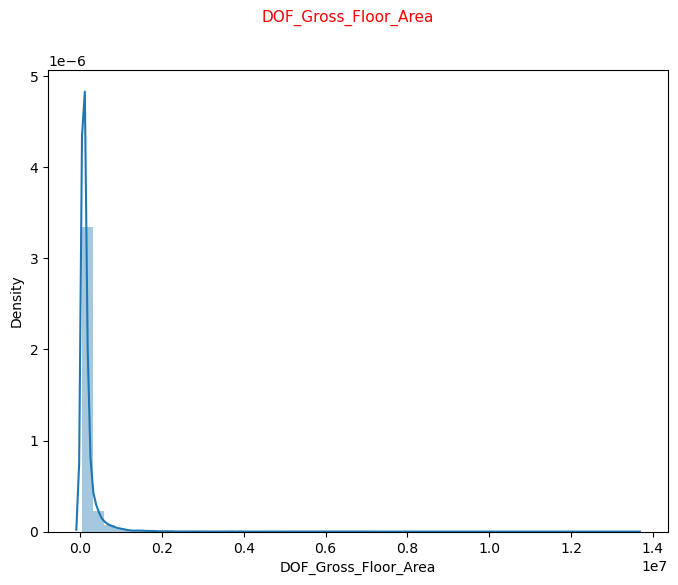

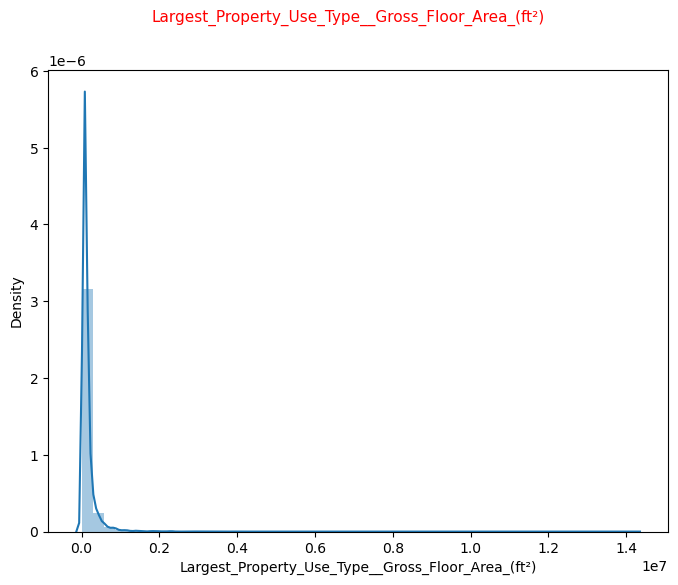

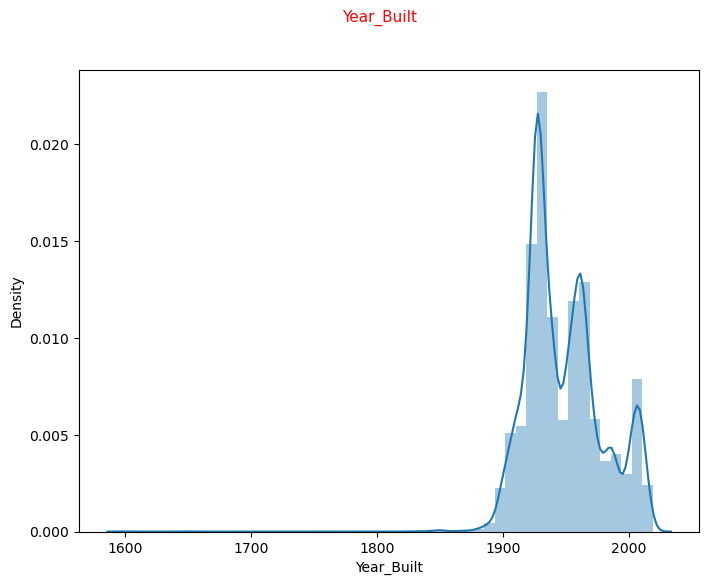

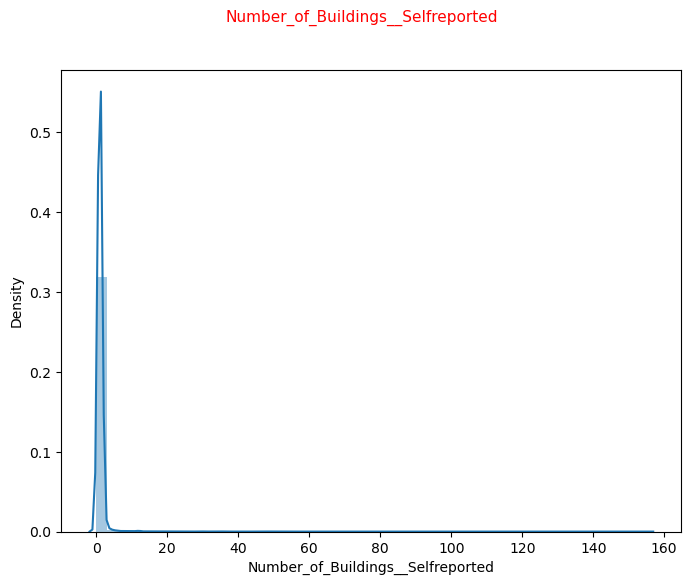

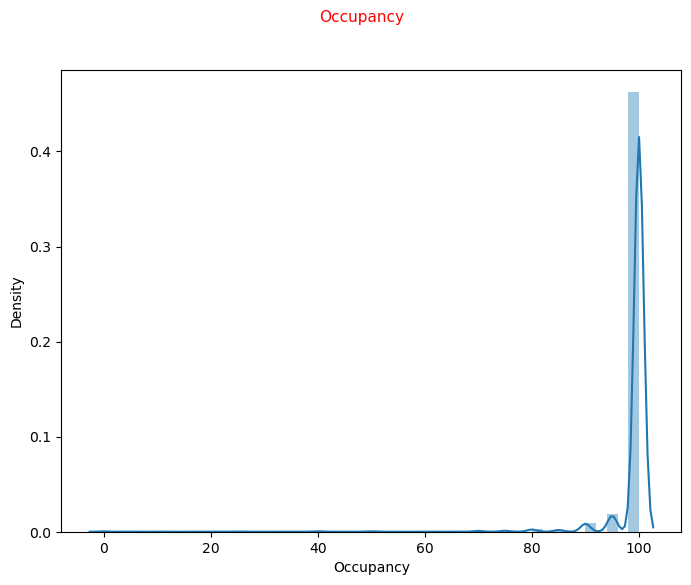

...

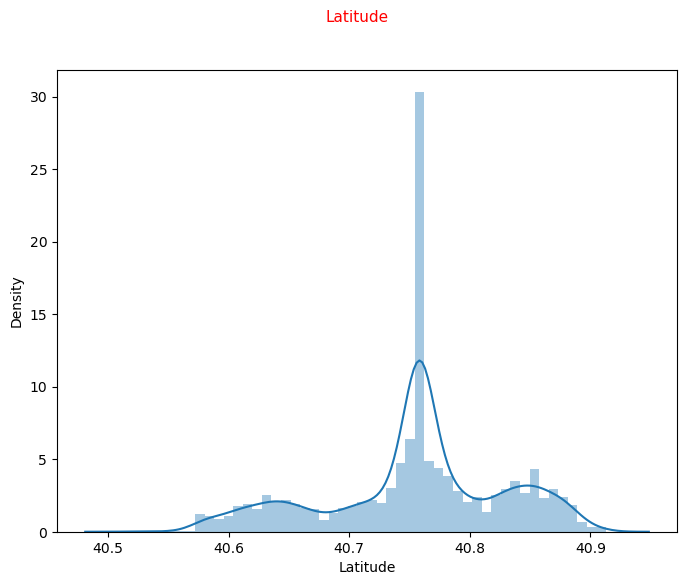

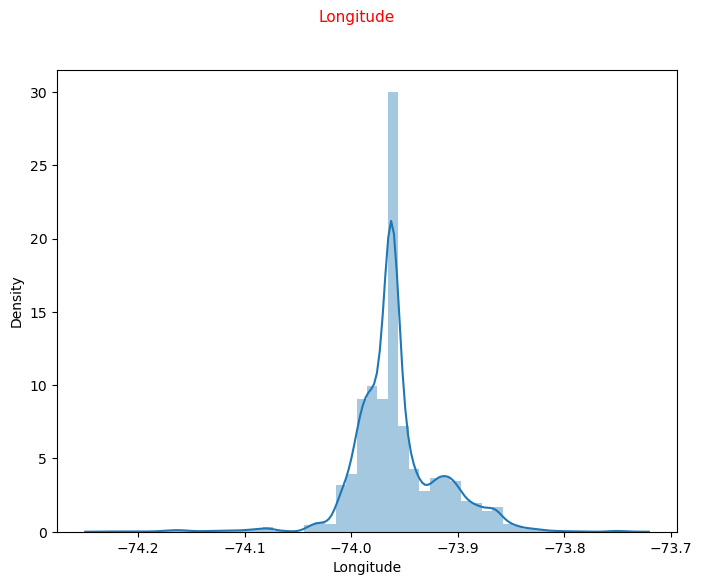

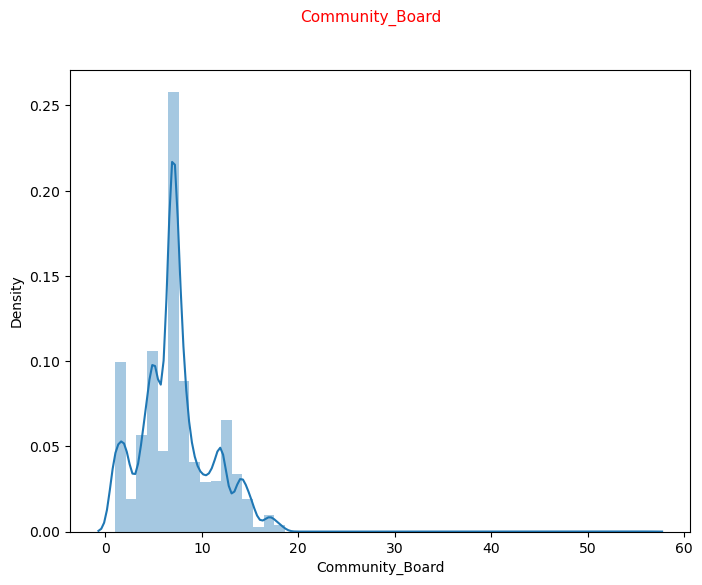

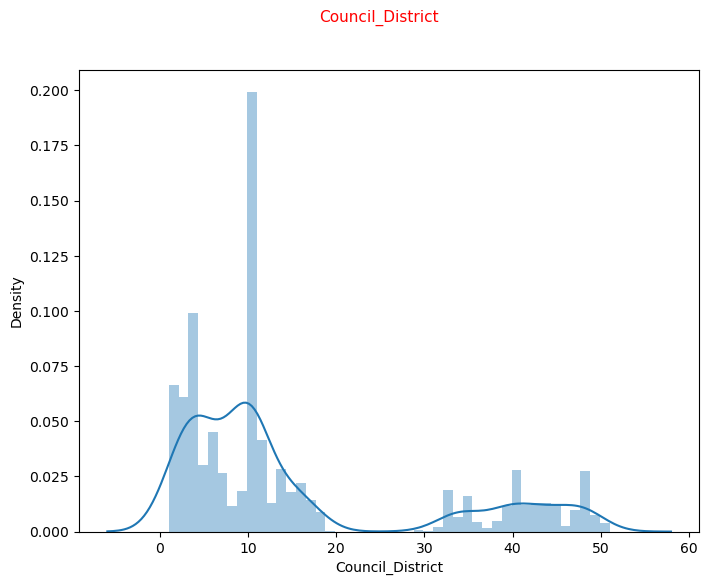

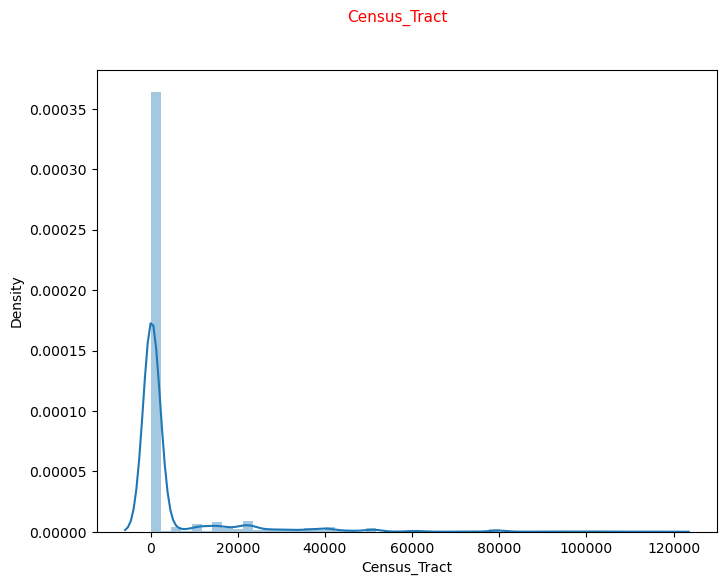

In [44]:
# from below distibution data is not normally ditributed.
for i in dff.columns:
    if dff[i].dtype.name != 'object':
        plt.figure(figsize=[8,6])
        plt.suptitle(i,color='red',fontsize=11)
        sns.distplot(dff[i])
        plt.show()

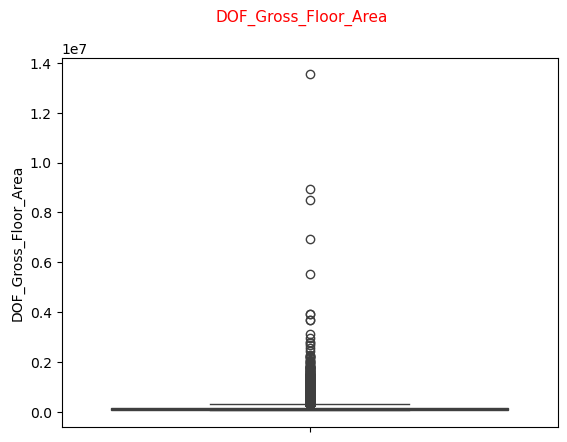

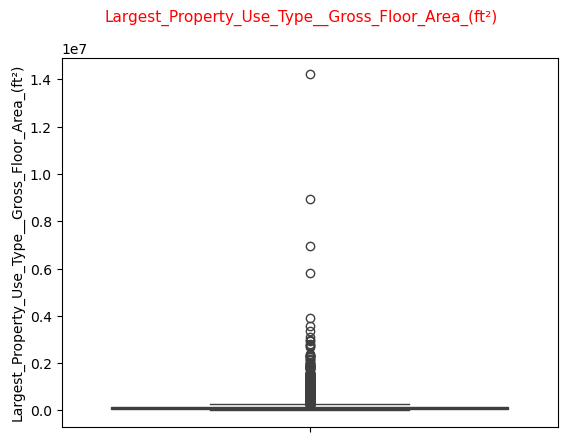

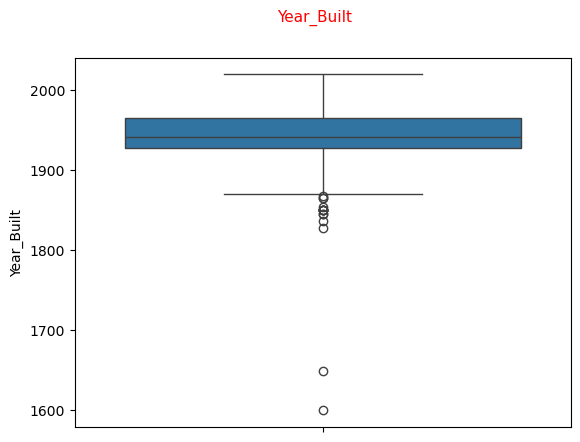

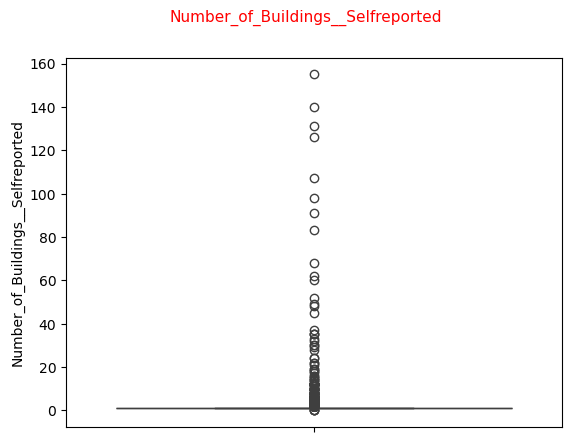

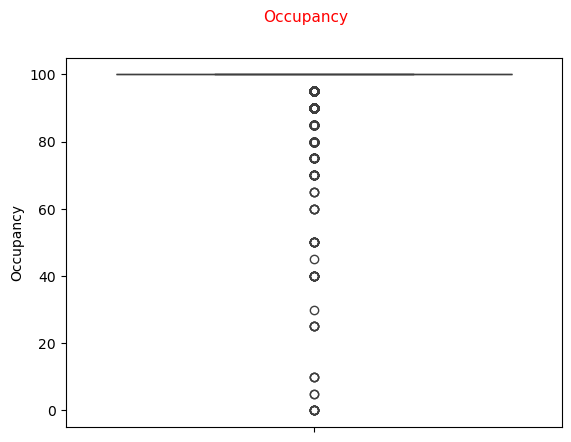

...

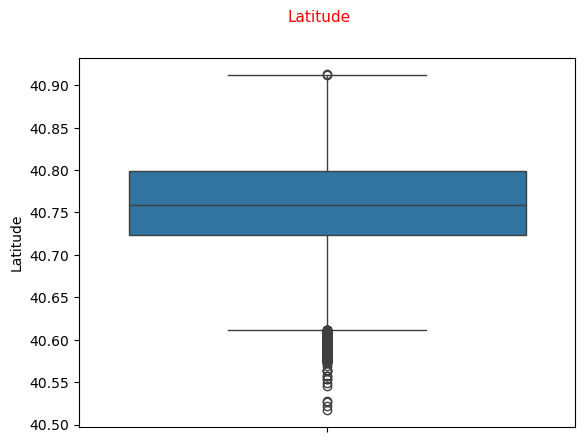

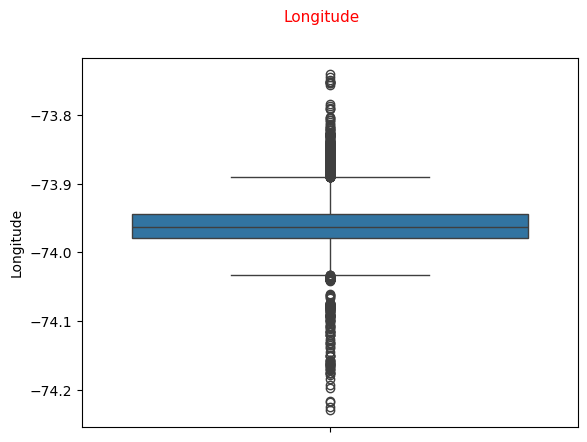

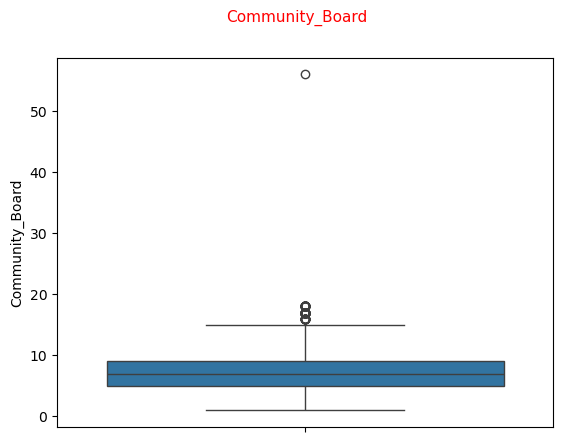

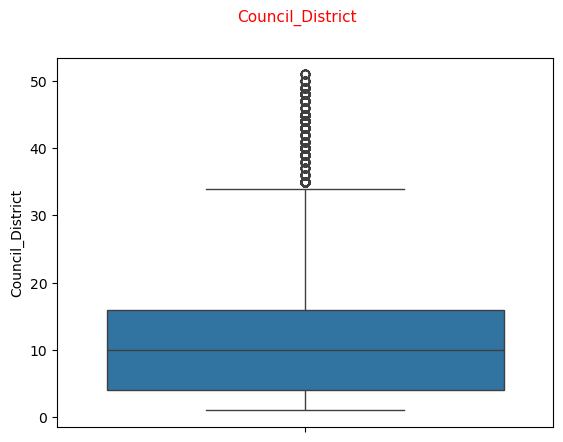

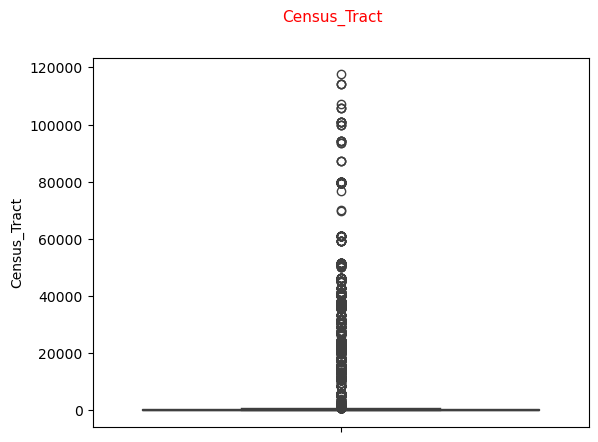

In [45]:
# outlier detection using boxplot
for i in dff.columns:
    if dff[i].dtype.name != 'object':
        plt.suptitle(i,color='red',fontsize=11)
        sns.boxplot(dff,y=i)
        plt.show()

In [46]:
# finding the outlier in data set and cap the outliers. by using IQR method
q3 = dff.quantile(0.75,numeric_only=True)
q1 = dff.quantile(0.25,numeric_only=True)
iqr = q3 - q1
upper = q3 + 1.5 * iqr
lower = q1 - 1.5 * iqr

In [47]:
dff.describe()

,DOF_Gross_Floor_Area,Largest_Property_Use_Type__Gross_Floor_Area_(ft²),Year_Built,Number_of_Buildings__Selfreported,Occupancy,ENERGY_STAR_Score,Site_EUI_(kBtu/ft²),Weather_Normalized_Site_EUI_(kBtu/ft²),Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²),Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²),Weather_Normalized_Source_EUI_(kBtu/ft²),Natural_Gas_Use_(kBtu),Weather_Normalized_Site_Natural_Gas_Use_(therms),Electricity_Use__Grid_Purchase_(kBtu),Weather_Normalized_Site_Electricity_(kWh),Total_GHG_Emissions_(Metric_Tons_CO2e),Direct_GHG_Emissions_(Metric_Tons_CO2e),Indirect_GHG_Emissions_(Metric_Tons_CO2e),Property_GFA__SelfReported_(ft²),Source_EUI_(kBtu/ft²),Latitude,Longitude,Community_Board,Council_District,Census_Tract
count,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000
mean,164119.094,157391.127,1948.454,1.284,99.034,59.855,235.664,240.429,9.298,1.486,326.127,11783804.652,124690.826,5682689.727,1628774.797,2284.015,713.451,1570.956,162366.866,326.338,40.755,-73.957,7.245,15.226,4215.753
std,301912.279,286475.996,30.060,3.954,5.570,29.994,9034.569,9732.764,95.541,95.658,10317.504,504273375.110,5448209.993,32510609.832,9452725.518,58434.091,26787.222,51946.341,294173.452,9609.747,0.074,0.041,3.598,14.532,12247.398
min,50028.000,3190.000,1600.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-23134.300,120.000,0.000,40.517,-74.230,1.000,1.000,1.000
25%,65092.000,65780.250,1927.000,1.000,100.000,37.000,62.925,68.900,3.800,0.200,107.400,1684542.425,20633.600,1024737.650,303724.125,335.400,169.425,94.100,66917.250,100.100,40.724,-73.979,5.000,4.000,128.000
50%,91280.000,90641.500,1941.000,1.000,100.000,65.000,78.900,82.900,5.100,0.500,128.800,4206698.150,45380.700,1771008.800,516386.650,500.200,280.500,164.900,92584.000,124.400,40.759,-73.962,7.000,10.000,218.000
75%,153916.500,150194.750,1965.000,1.000,100.000,85.000,97.200,99.200,8.400,0.700,158.375,6374419.075,66369.950,4079112.850,1144931.000,890.600,447.775,399.675,154000.000,160.100,40.799,-73.944,9.000,16.000,428.000
max,13540113.000,14217119.000,2019.000,155.000,100.000,100.000,869265.000,939329.000,5304.400,9393.000,986366.000,49459193300.000,534458968.800,1691763071.000,495827334.500,4764455.600,2627015.000,4764375.000,14217119.000,912801.100,40.913,-73.741,56.000,51.000,117602.000


In [48]:
# upper limit of all columns in data set ,i.e independent variables
print(upper)

DOF_Gross_Floor_Area                                           287153.250
Largest_Property_Use_Type__Gross_Floor_Area_(ft²)              276816.500
Year_Built                                                       2022.000
Number_of_Buildings__Selfreported                                   1.000
Occupancy                                                         100.000
ENERGY_STAR_Score                                                 157.000
Site_EUI_(kBtu/ft²)                                               148.613
Weather_Normalized_Site_EUI_(kBtu/ft²)                            144.650
Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)            15.300
Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)          1.450
Weather_Normalized_Source_EUI_(kBtu/ft²)                          234.837
Natural_Gas_Use_(kBtu)                                       13409234.050
Weather_Normalized_Site_Natural_Gas_Use_(therms)               134974.475
Electricity_Use__Grid_Purchase_(kBtu) 

In [49]:
# lower limit of all columns in data set ,i.e independent variables
print(lower)

DOF_Gross_Floor_Area                                           -68144.750
Largest_Property_Use_Type__Gross_Floor_Area_(ft²)              -60841.500
Year_Built                                                       1870.000
Number_of_Buildings__Selfreported                                   1.000
Occupancy                                                         100.000
ENERGY_STAR_Score                                                 -35.000
Site_EUI_(kBtu/ft²)                                                11.512
Weather_Normalized_Site_EUI_(kBtu/ft²)                             23.450
Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)            -3.100
Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)         -0.550
Weather_Normalized_Source_EUI_(kBtu/ft²)                           30.938
Natural_Gas_Use_(kBtu)                                       -5350272.550
Weather_Normalized_Site_Natural_Gas_Use_(therms)               -47970.925
Electricity_Use__Grid_Purchase_(kBtu) 

In [50]:
# capping the ouliers in the data set.
for i in dff.columns:
     if dff[i].dtype.name != 'object':
        q3 = dff[i].quantile(0.75)
        q1 = dff[i].quantile(0.25)
        iqr = q3 - q1
        upper = q3 + 1.5 * iqr
        lower = q1 - 1.5 * iqr
        dff[i] = np.where(dff[i] > upper,upper,np.where(dff[i] < lower,lower,dff[i]))

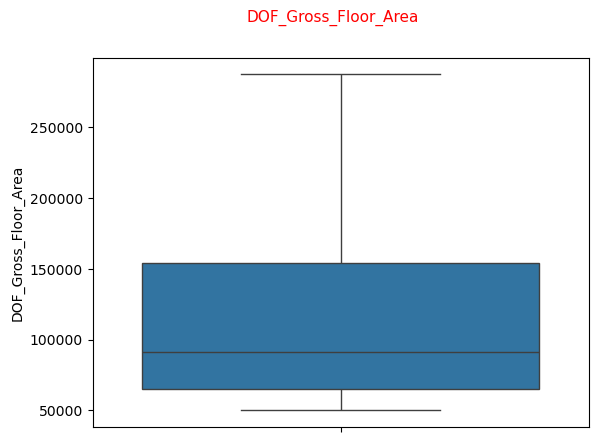

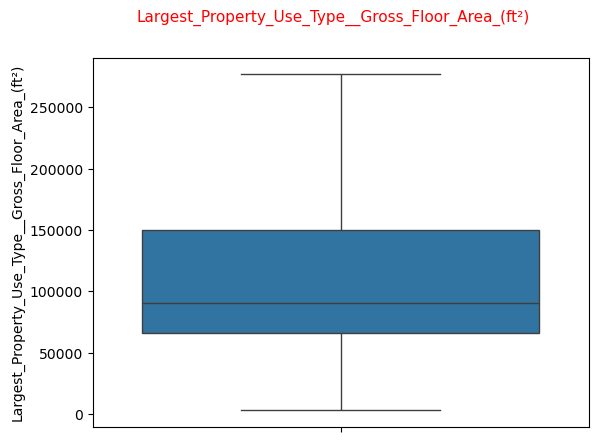

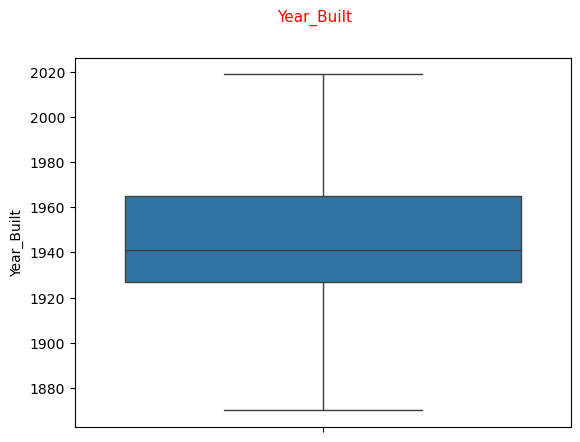

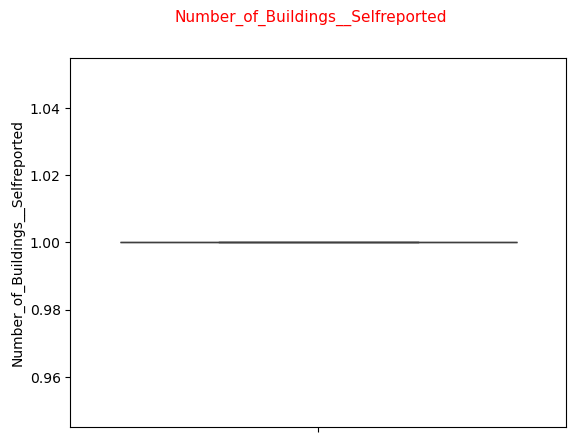

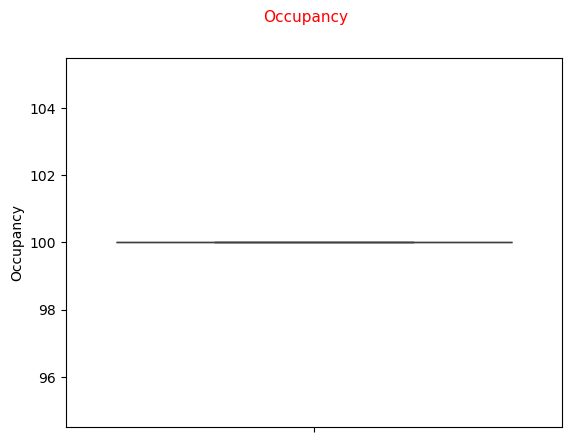

...

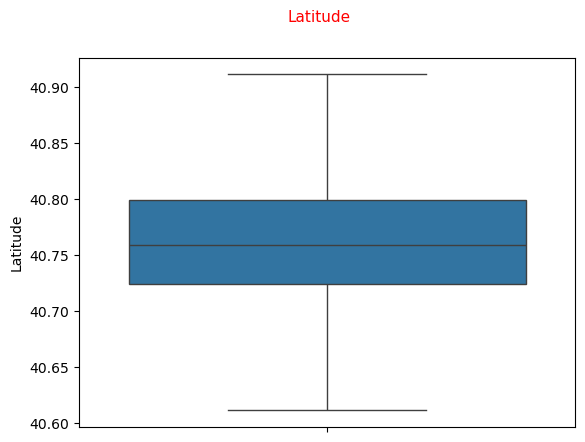

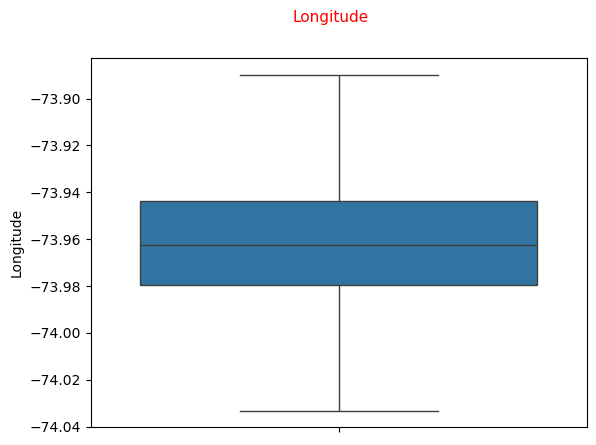

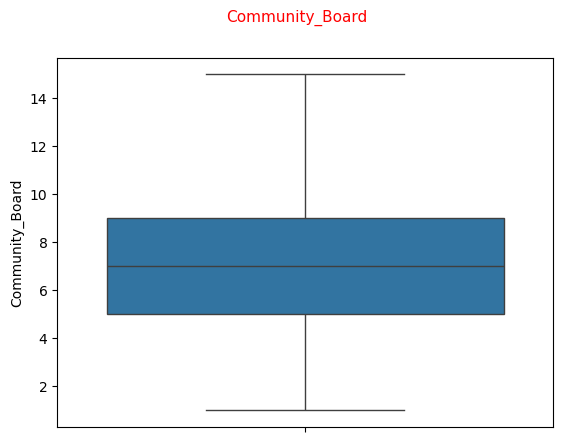

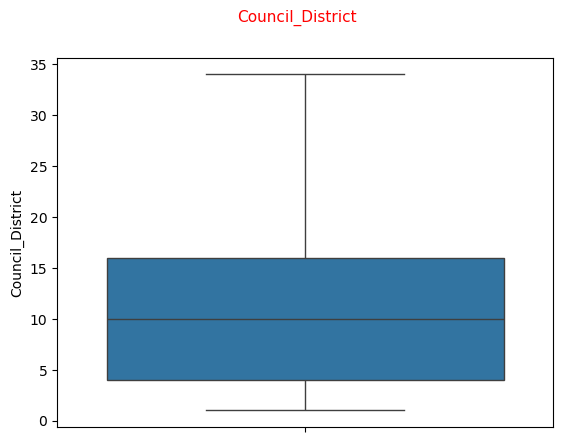

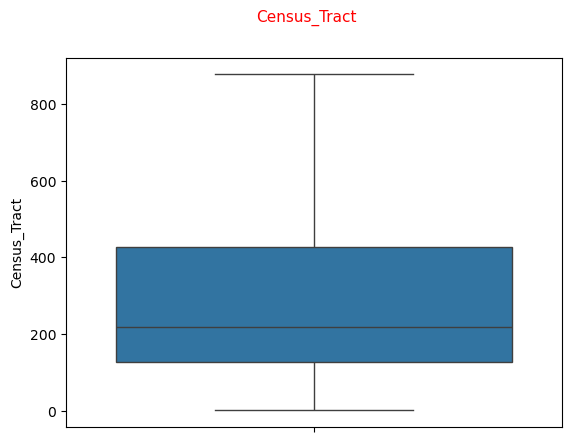

In [51]:
# after capping the ouliers in tha data set.
for i in dff.columns:
    if dff[i].dtype.name != 'object':
        plt.suptitle(i,color='red',fontsize=11)
        sns.boxplot(dff,y=i)
        plt.show()

In [52]:
dff.describe()

,DOF_Gross_Floor_Area,Largest_Property_Use_Type__Gross_Floor_Area_(ft²),Year_Built,Number_of_Buildings__Selfreported,Occupancy,ENERGY_STAR_Score,Site_EUI_(kBtu/ft²),Weather_Normalized_Site_EUI_(kBtu/ft²),Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²),Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²),Weather_Normalized_Source_EUI_(kBtu/ft²),Natural_Gas_Use_(kBtu),Weather_Normalized_Site_Natural_Gas_Use_(therms),Electricity_Use__Grid_Purchase_(kBtu),Weather_Normalized_Site_Electricity_(kWh),Total_GHG_Emissions_(Metric_Tons_CO2e),Direct_GHG_Emissions_(Metric_Tons_CO2e),Indirect_GHG_Emissions_(Metric_Tons_CO2e),Property_GFA__SelfReported_(ft²),Source_EUI_(kBtu/ft²),Latitude,Longitude,Community_Board,Council_District,Census_Tract
count,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000,9642.000
mean,123186.006,120331.835,1948.533,1.000,100.000,59.855,80.685,84.154,6.588,0.487,135.564,4757626.895,50107.756,2975856.293,840138.500,684.897,331.828,290.879,123229.384,133.351,40.756,-73.958,7.204,13.596,325.380
std,76445.716,72636.374,29.626,0.000,0.000,29.994,31.001,28.505,3.993,0.333,47.187,3821359.547,38411.694,2683874.879,742229.189,489.864,246.261,272.667,75015.778,52.991,0.072,0.033,3.469,11.374,281.585
min,50028.000,3190.000,1870.000,1.000,100.000,1.000,11.512,23.450,0.000,0.000,30.938,0.000,0.000,0.000,0.000,0.000,0.000,-364.263,120.000,10.100,40.611,-74.033,1.000,1.000,1.000
25%,65092.000,65780.250,1927.000,1.000,100.000,37.000,62.925,68.900,3.800,0.200,107.400,1684542.425,20633.600,1024737.650,303724.125,335.400,169.425,94.100,66917.250,100.100,40.724,-73.979,5.000,4.000,128.000
50%,91280.000,90641.500,1941.000,1.000,100.000,65.000,78.900,82.900,5.100,0.500,128.800,4206698.150,45380.700,1771008.800,516386.650,500.200,280.500,164.900,92584.000,124.400,40.759,-73.962,7.000,10.000,218.000
75%,153916.500,150194.750,1965.000,1.000,100.000,85.000,97.200,99.200,8.400,0.700,158.375,6374419.075,66369.950,4079112.850,1144931.000,890.600,447.775,399.675,154000.000,160.100,40.799,-73.944,9.000,16.000,428.000
max,287153.250,276816.500,2019.000,1.000,100.000,100.000,148.613,144.650,15.300,1.450,234.837,13409234.050,134974.475,8660675.650,2406741.312,1723.400,865.300,858.038,284624.125,250.100,40.912,-73.890,15.000,34.000,878.000


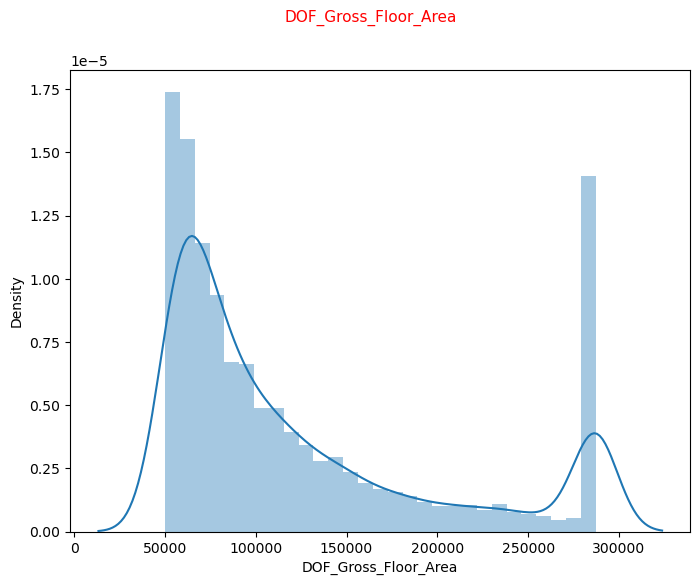

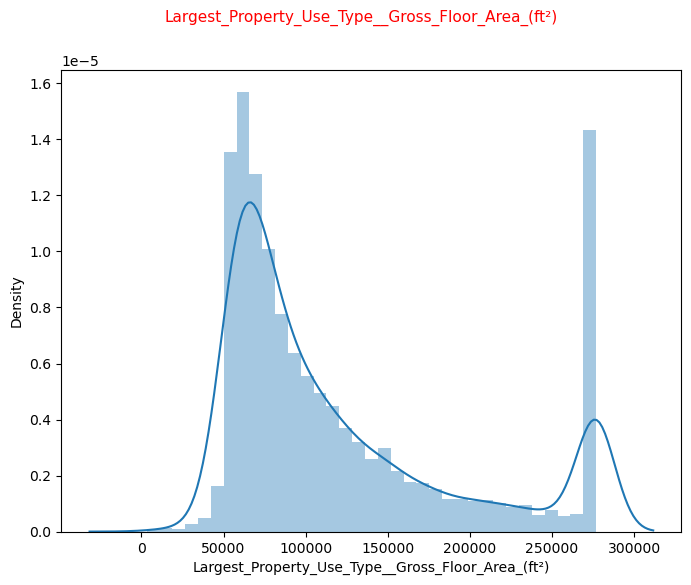

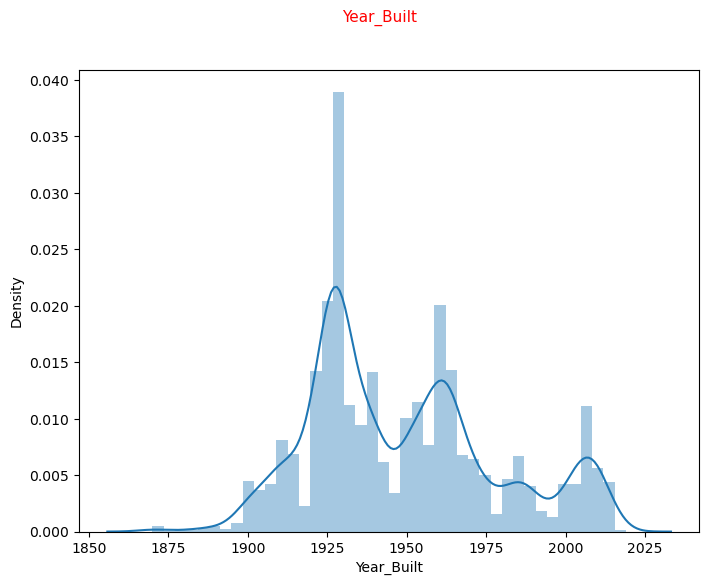

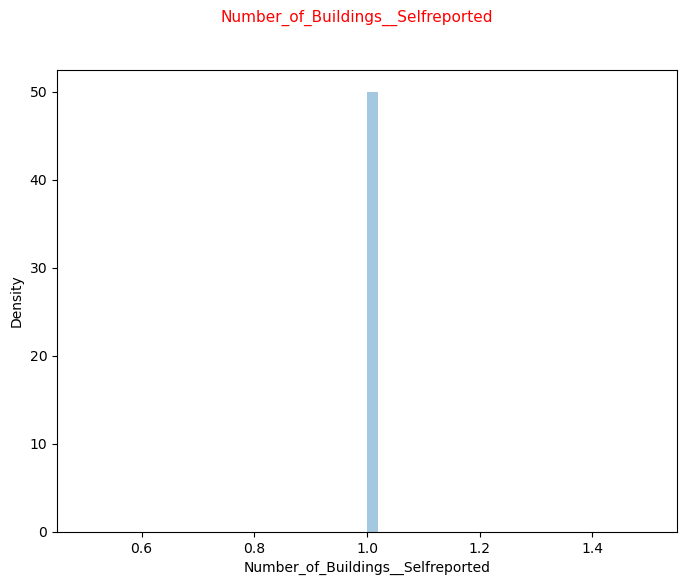

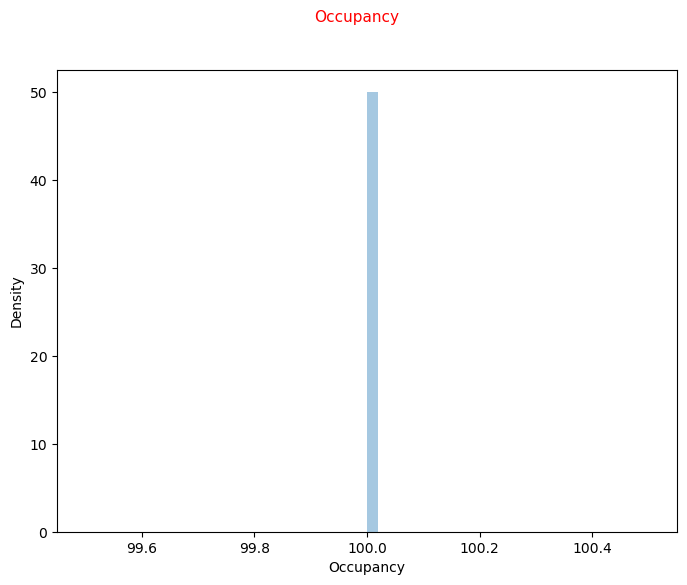

...

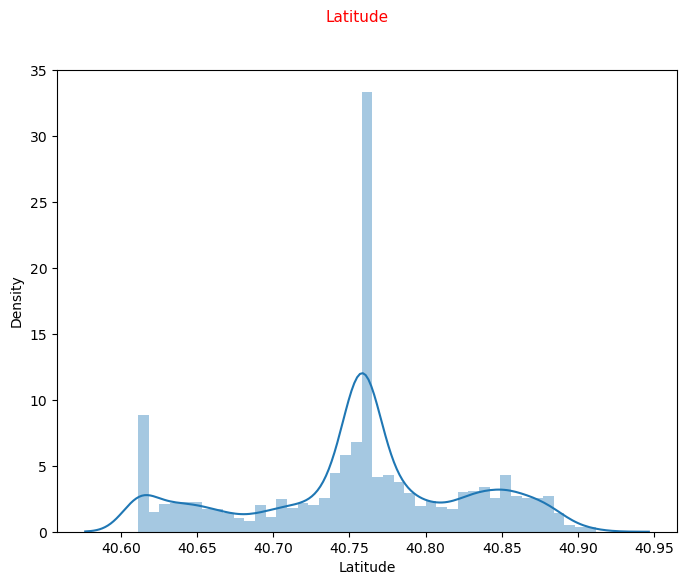

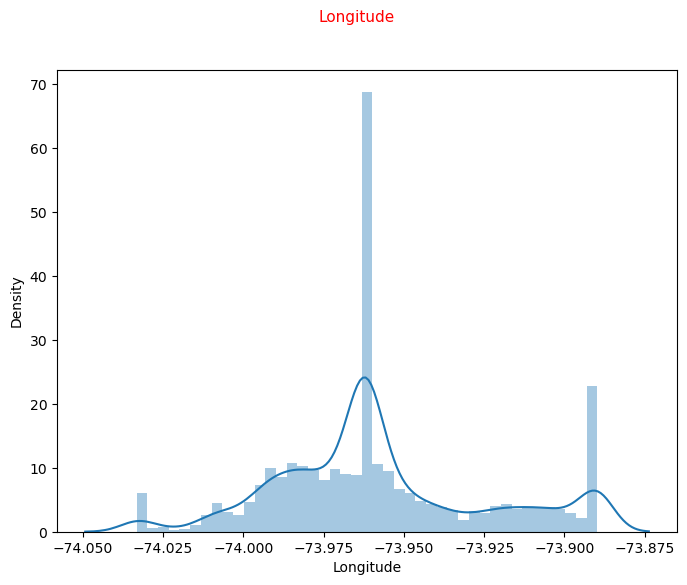

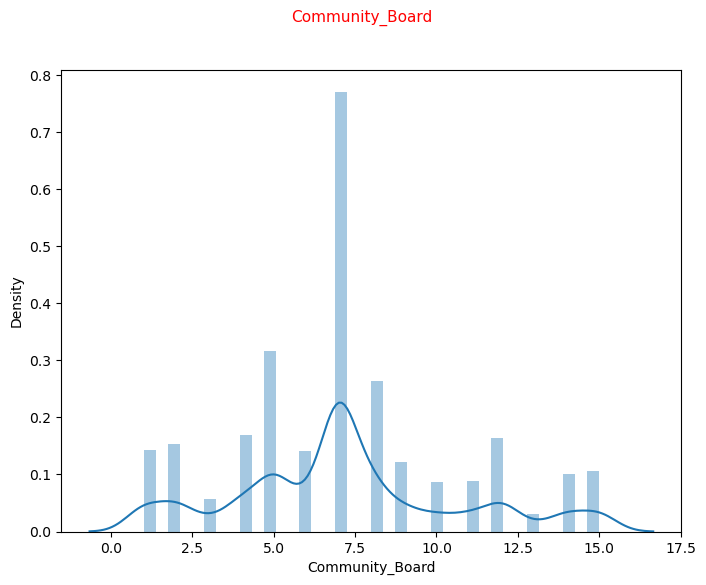

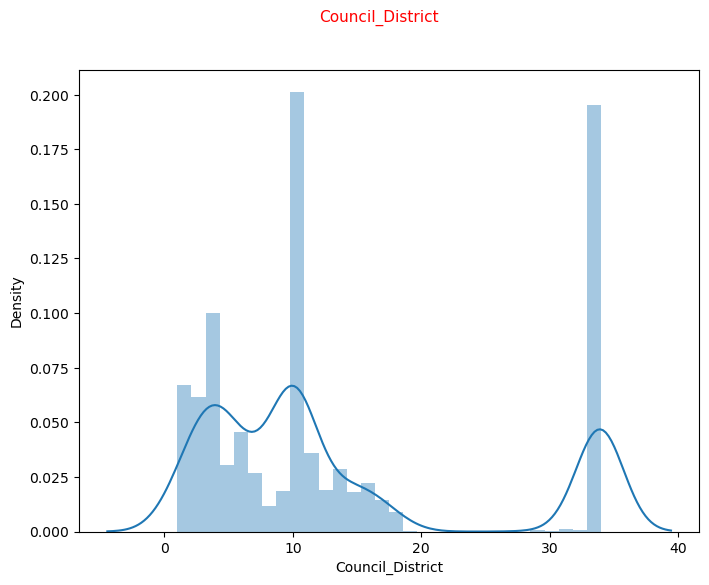

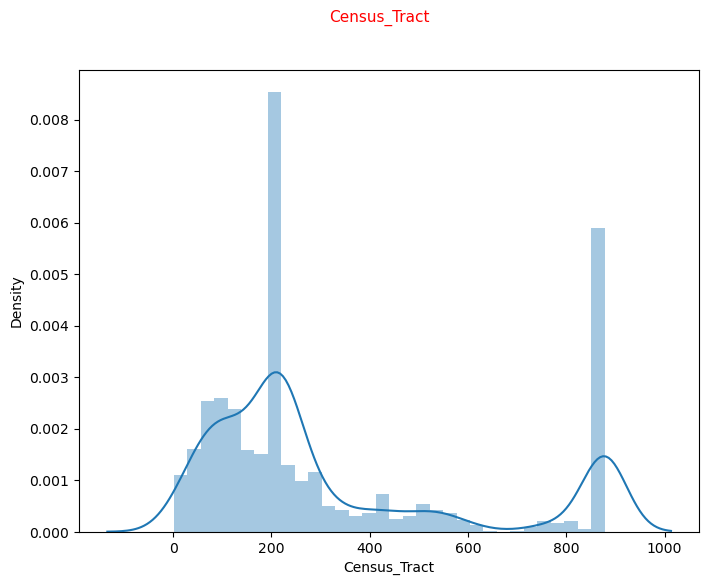

In [53]:
# After capping the outliers in data then ditribution become.
for i in dff.columns:
    if dff[i].dtype.name != 'object':
        plt.figure(figsize=[8,6])
        plt.suptitle(i,color='red',fontsize=11)
        sns.distplot(dff[i])
        plt.show()

In [54]:
dff.shape

(9642, 28)

In [55]:
dff.head(3)

,DOF_Gross_Floor_Area,Largest_Property_Use_Type__Gross_Floor_Area_(ft²),Year_Built,Number_of_Buildings__Selfreported,Occupancy,ENERGY_STAR_Score,Site_EUI_(kBtu/ft²),Weather_Normalized_Site_EUI_(kBtu/ft²),Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²),Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²),Weather_Normalized_Source_EUI_(kBtu/ft²),Natural_Gas_Use_(kBtu),Weather_Normalized_Site_Natural_Gas_Use_(therms),Electricity_Use__Grid_Purchase_(kBtu),Weather_Normalized_Site_Electricity_(kWh),Total_GHG_Emissions_(Metric_Tons_CO2e),Direct_GHG_Emissions_(Metric_Tons_CO2e),Indirect_GHG_Emissions_(Metric_Tons_CO2e),Property_GFA__SelfReported_(ft²),Source_EUI_(kBtu/ft²),Latitude,Longitude,Community_Board,Council_District,Census_Tract,Primary_Property_Type__Self_Selected,Metered_Areas_(Energy),Water_Required?
1,287153.250,276816.500,1969.000,1.000,100.000,55.000,148.613,144.650,15.300,1.450,234.837,13409234.050,134974.475,8660675.650,2406741.312,1723.400,865.300,858.038,284624.125,250.100,40.841,-73.943,12.000,10.000,251.000,Hospital (General Medical & Surgical),Whole Building,No
5,287153.250,276816.500,1932.000,1.000,100.000,55.000,148.613,144.650,8.300,1.450,234.837,13409234.050,134974.475,8660675.650,2406741.312,1723.400,865.300,-364.263,284624.125,250.100,40.761,-73.958,8.000,5.000,116.000,Hospital (General Medical & Surgical),Whole Building,No
12,91280.000,276816.500,1903.000,1.000,100.000,93.000,32.000,82.900,7.500,0.000,128.800,2047200.000,20472.000,8660675.650,2406741.312,1194.000,150.800,858.038,284624.125,87.900,40.759,-73.962,7.000,10.000,218.000,Multifamily Housing,Whole Building,Yes


# EDA

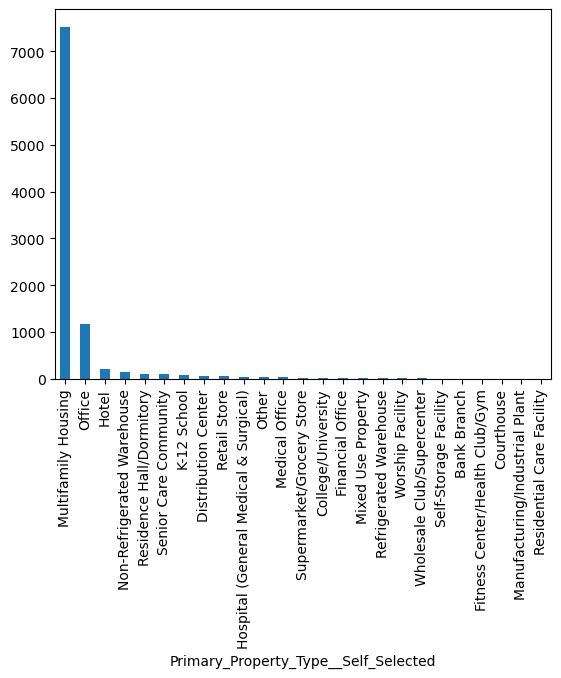

In [56]:
dff['Primary_Property_Type__Self_Selected'].value_counts().plot(kind='bar')
plt.show()

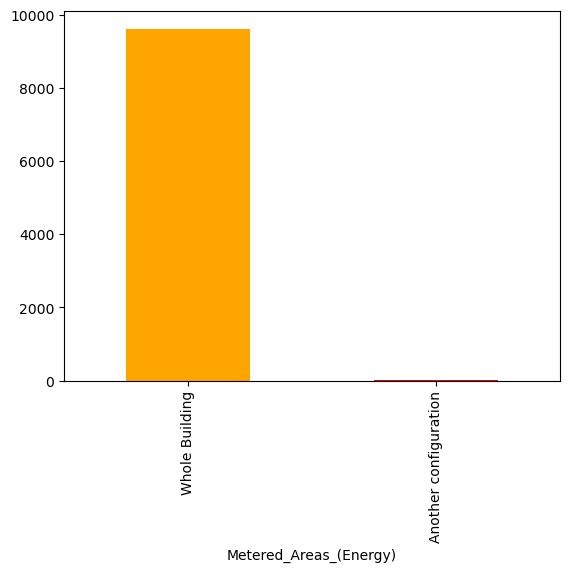

In [57]:
dff['Metered_Areas_(Energy)'].value_counts().plot(kind='bar',color=['orange','red'])
plt.show()

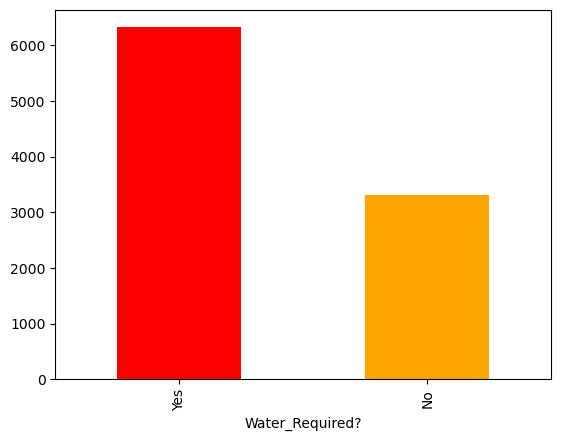

In [58]:
dff['Water_Required?'].value_counts().plot(kind='bar',color=['red','orange'])
plt.show()

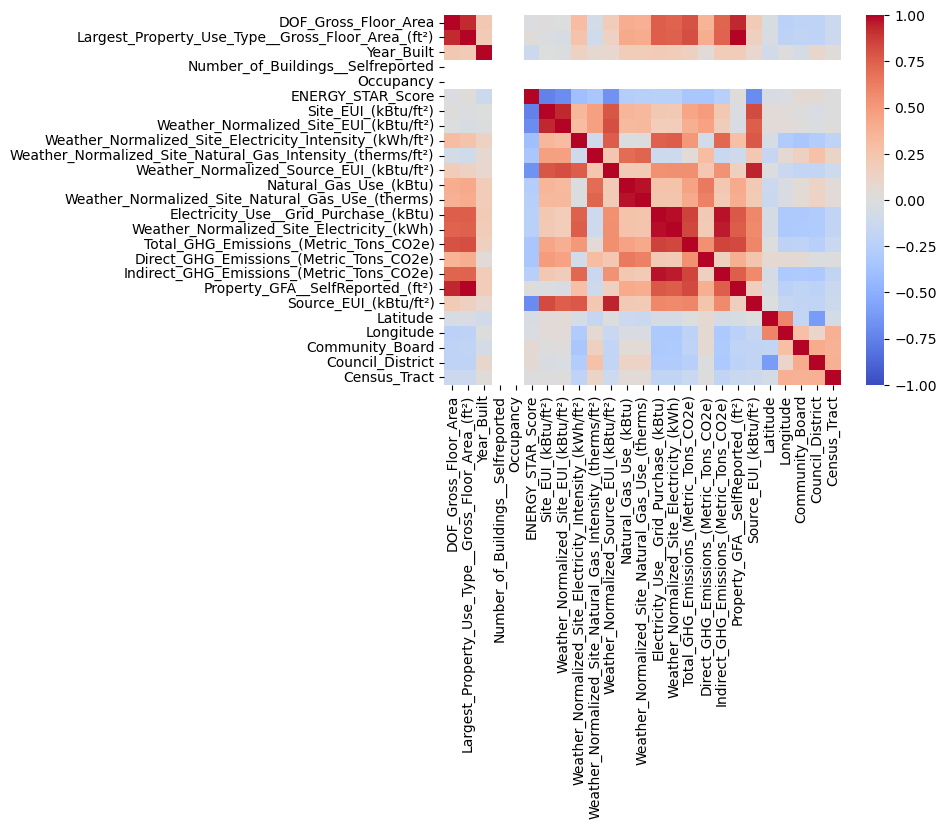

<Figure size 2000x800 with 0 Axes>

In [59]:
sns.heatmap(dff.corr(numeric_only=True),vmax=1,vmin=-1,cmap='coolwarm')
plt.figure(figsize=(20,8))
plt.show()

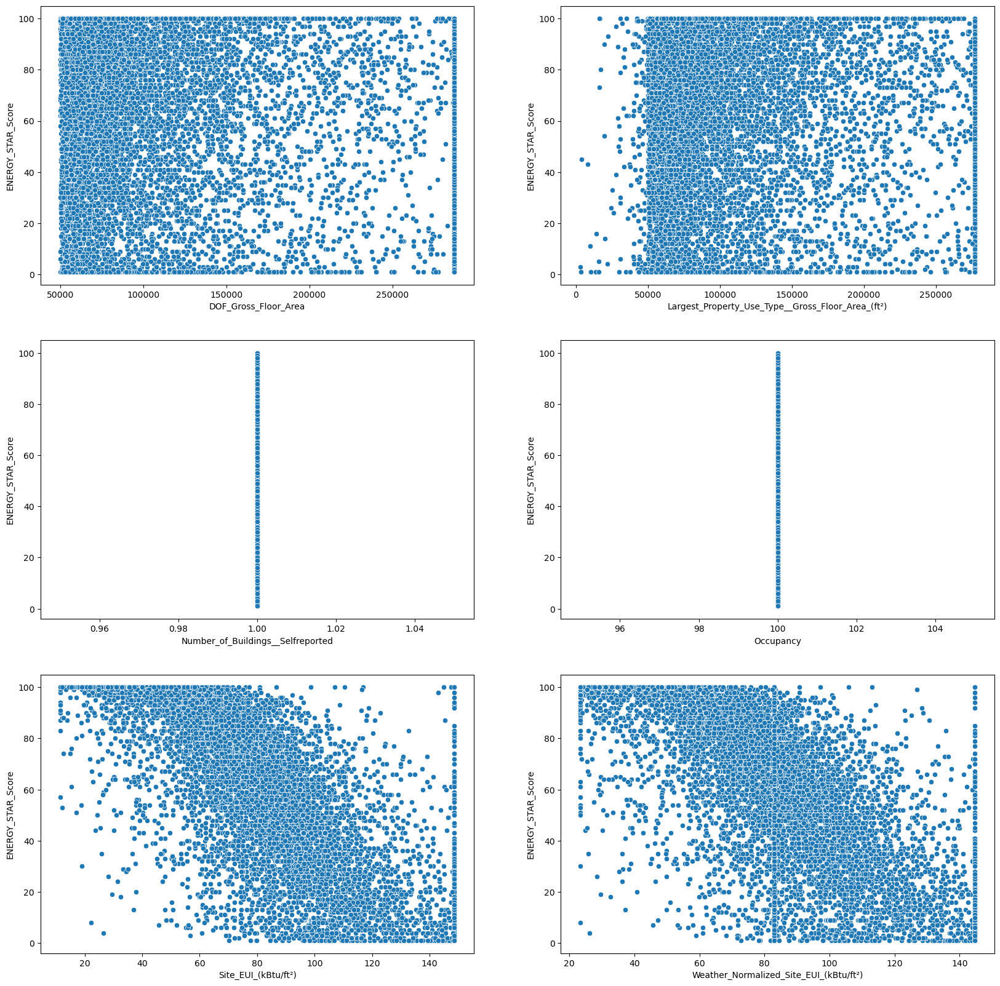

In [60]:
plt.figure(figsize=[20,20])
plt.subplot(321)
sns.scatterplot(dff,x='DOF_Gross_Floor_Area',y='ENERGY_STAR_Score')

plt.subplot(322)
sns.scatterplot(dff,x='Largest_Property_Use_Type__Gross_Floor_Area_(ft²)',y='ENERGY_STAR_Score')

plt.subplot(323)
sns.scatterplot(dff,x='Number_of_Buildings__Selfreported',y='ENERGY_STAR_Score')

plt.subplot(324)
sns.scatterplot(dff,x='Occupancy',y='ENERGY_STAR_Score')

plt.subplot(325)
sns.scatterplot(dff,x='Site_EUI_(kBtu/ft²)',y='ENERGY_STAR_Score')

plt.subplot(326)
sns.scatterplot(dff,x='Weather_Normalized_Site_EUI_(kBtu/ft²)',y='ENERGY_STAR_Score')

plt.show()

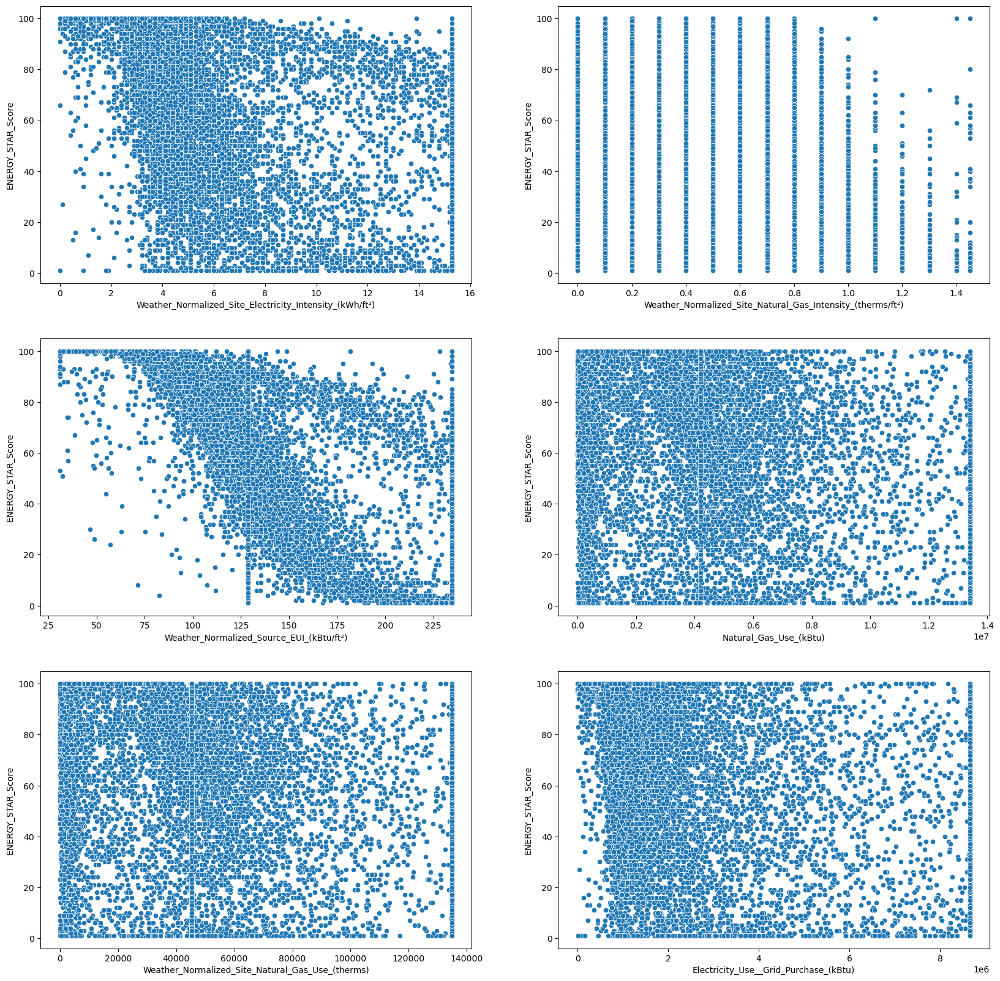

In [61]:
plt.figure(figsize=[20,20])
plt.subplot(321)
sns.scatterplot(dff,x='Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)',y='ENERGY_STAR_Score')

plt.subplot(322)
sns.scatterplot(dff,x='Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)',y='ENERGY_STAR_Score')

plt.subplot(323)
sns.scatterplot(dff,x='Weather_Normalized_Source_EUI_(kBtu/ft²)',y='ENERGY_STAR_Score')

plt.subplot(324)
sns.scatterplot(dff,x='Natural_Gas_Use_(kBtu)',y='ENERGY_STAR_Score')

plt.subplot(325)
sns.scatterplot(dff,x='Weather_Normalized_Site_Natural_Gas_Use_(therms)',y='ENERGY_STAR_Score')

plt.subplot(326)
sns.scatterplot(dff,x='Electricity_Use__Grid_Purchase_(kBtu)',y='ENERGY_STAR_Score')

plt.show()

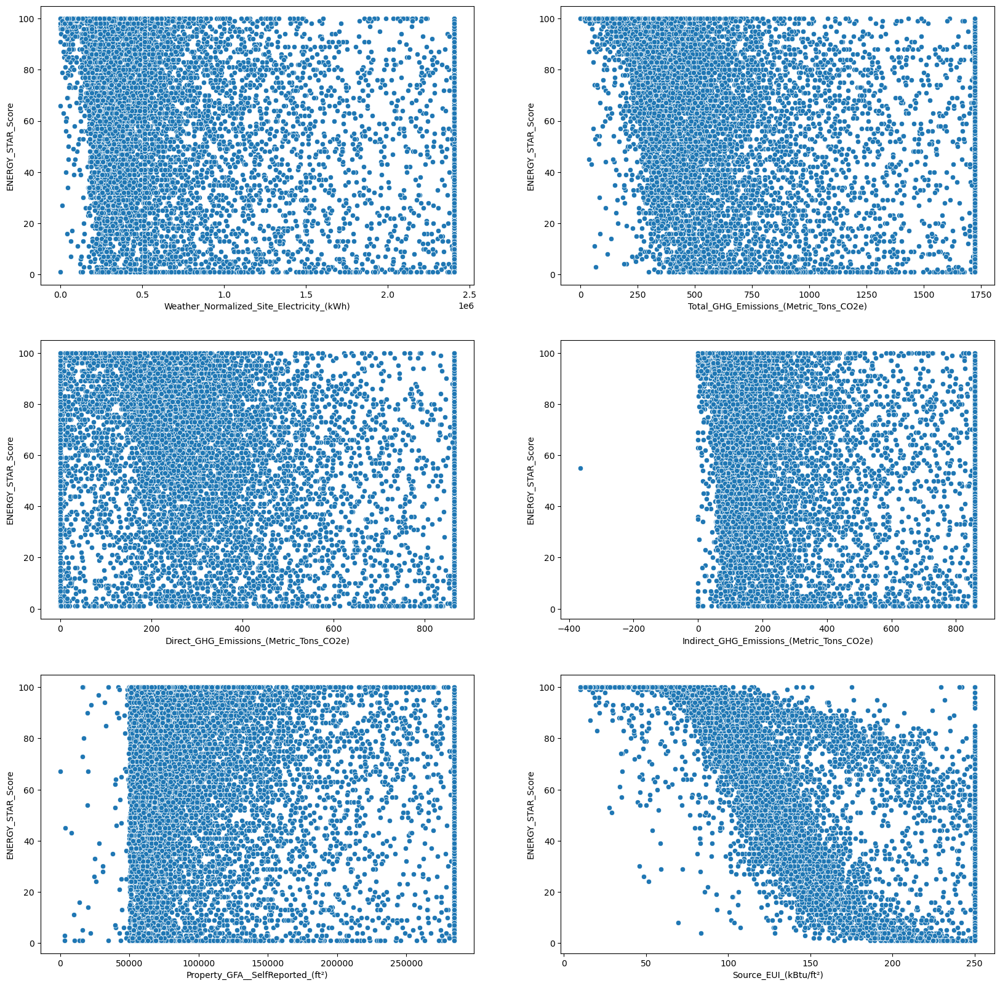

In [62]:
plt.figure(figsize=[20,20])
plt.subplot(321)
sns.scatterplot(dff,x='Weather_Normalized_Site_Electricity_(kWh)',y='ENERGY_STAR_Score')

plt.subplot(322)
sns.scatterplot(dff,x='Total_GHG_Emissions_(Metric_Tons_CO2e)',y='ENERGY_STAR_Score')

plt.subplot(323)
sns.scatterplot(dff,x='Direct_GHG_Emissions_(Metric_Tons_CO2e)',y='ENERGY_STAR_Score')

plt.subplot(324)
sns.scatterplot(dff,x='Indirect_GHG_Emissions_(Metric_Tons_CO2e)',y='ENERGY_STAR_Score')

plt.subplot(325)
sns.scatterplot(dff,x='Property_GFA__SelfReported_(ft²)',y='ENERGY_STAR_Score')

plt.subplot(326)
sns.scatterplot(dff,x='Source_EUI_(kBtu/ft²)',y='ENERGY_STAR_Score')

plt.show()

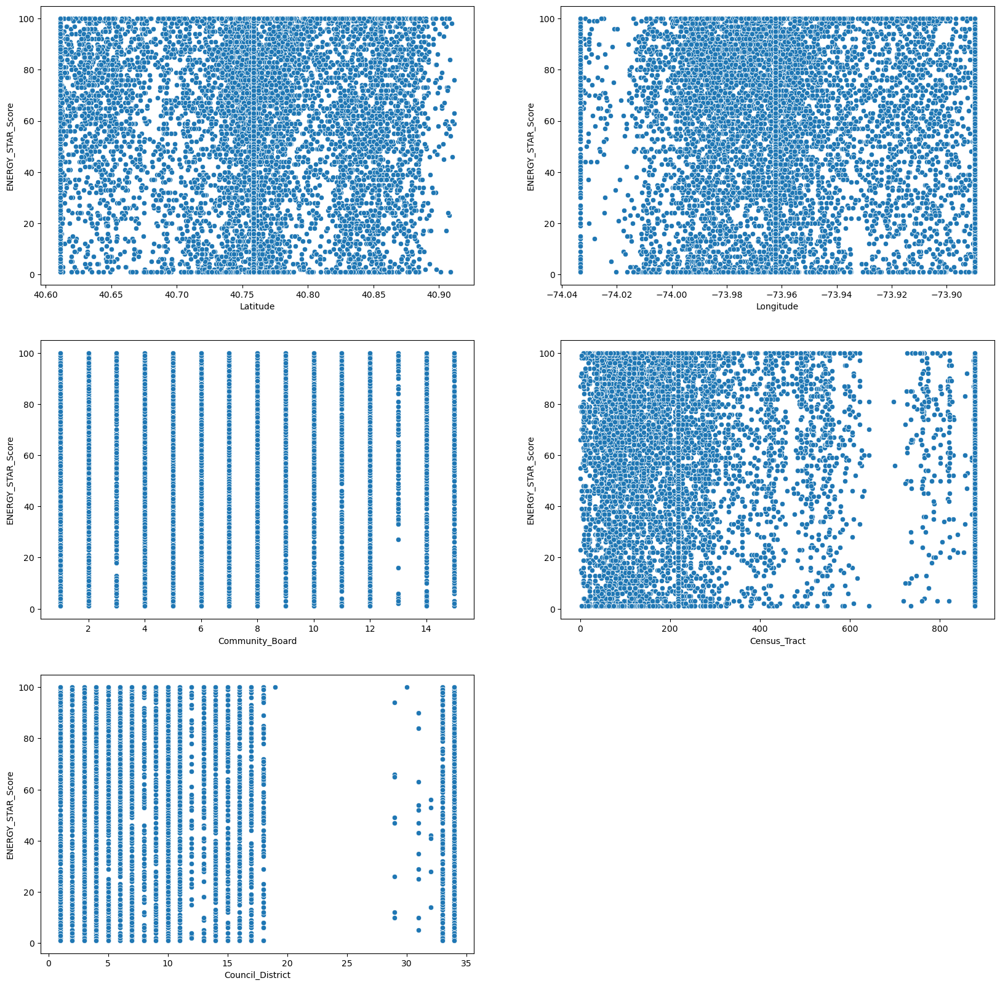

In [63]:
plt.figure(figsize=[20,20])
plt.subplot(321)
sns.scatterplot(dff,x='Latitude',y='ENERGY_STAR_Score')

plt.subplot(322)
sns.scatterplot(dff,x='Longitude',y='ENERGY_STAR_Score')

plt.subplot(323)
sns.scatterplot(dff,x='Community_Board',y='ENERGY_STAR_Score')

plt.subplot(324)
sns.scatterplot(dff,x='Census_Tract',y='ENERGY_STAR_Score')

plt.subplot(325)
sns.scatterplot(dff,x='Council_District',y='ENERGY_STAR_Score')

plt.show()

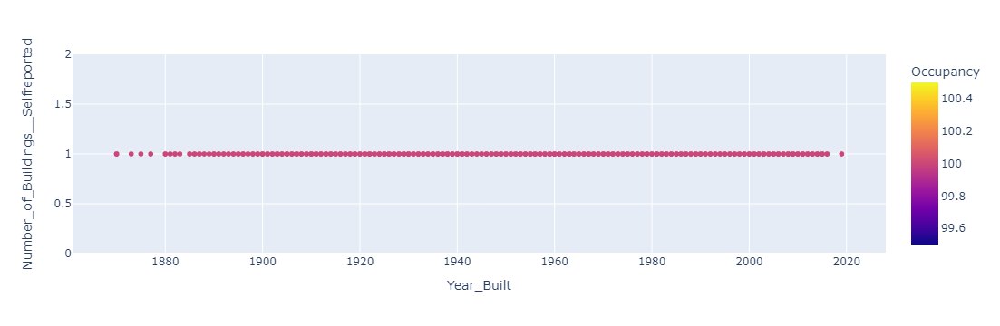

In [66]:
px.scatter(dff,x='Year_Built',y='Number_of_Buildings__Selfreported',color="Occupancy")

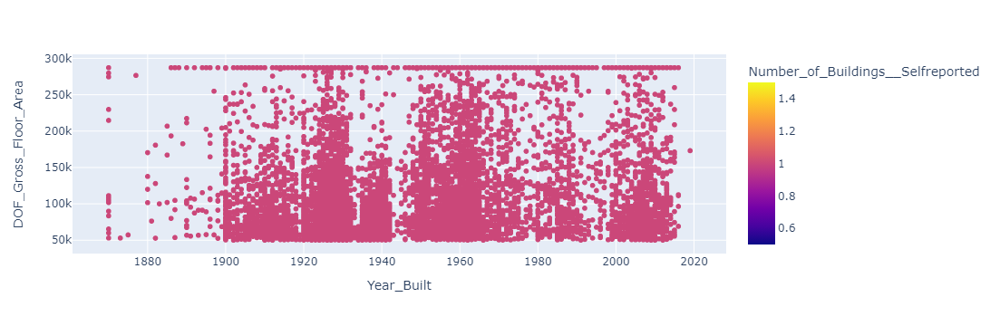

In [67]:
px.scatter(dff,x='Year_Built',y='DOF_Gross_Floor_Area',color="Number_of_Buildings__Selfreported")

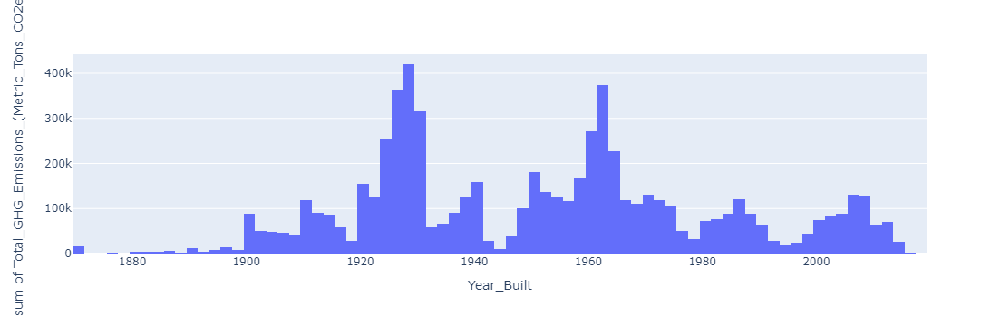

In [81]:
px.histogram(dff,x='Year_Built',y='Total_GHG_Emissions_(Metric_Tons_CO2e)')

In [69]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor,VotingRegressor,StackingRegressor
from sklearn.svm import SVR
from sklearn.compose import ColumnTransformer
from sklearn.metrics import r2_score,mean_squared_error,root_mean_squared_error

In [70]:
x = dff.drop('ENERGY_STAR_Score',axis=1)
y = dff['ENERGY_STAR_Score']

In [71]:
from sklearn.model_selection import train_test_split
x_trian,x_test,y_train,y_test = train_test_split(x,y,train_size=0.7,random_state=42)

In [72]:
cat_col = ['Primary_Property_Type__Self_Selected', 'Metered_Areas_(Energy)','Water_Required?']
num_col =['DOF_Gross_Floor_Area',
       'Largest_Property_Use_Type__Gross_Floor_Area_(ft²)', 'Year_Built',
       'Number_of_Buildings__Selfreported', 'Occupancy',
       'Site_EUI_(kBtu/ft²)', 'Weather_Normalized_Site_EUI_(kBtu/ft²)',
       'Weather_Normalized_Site_Electricity_Intensity_(kWh/ft²)',
       'Weather_Normalized_Site_Natural_Gas_Intensity_(therms/ft²)',
       'Weather_Normalized_Source_EUI_(kBtu/ft²)', 'Natural_Gas_Use_(kBtu)',
       'Weather_Normalized_Site_Natural_Gas_Use_(therms)',
       'Electricity_Use__Grid_Purchase_(kBtu)',
       'Weather_Normalized_Site_Electricity_(kWh)',
       'Total_GHG_Emissions_(Metric_Tons_CO2e)',
       'Direct_GHG_Emissions_(Metric_Tons_CO2e)',
       'Indirect_GHG_Emissions_(Metric_Tons_CO2e)',
       'Property_GFA__SelfReported_(ft²)', 'Source_EUI_(kBtu/ft²)', 'Latitude',
       'Longitude', 'Community_Board', 'Council_District', 'Census_Tract']

In [82]:
num_transfer = Pipeline([("Standard_scale",StandardScaler())])
cat_transfer = Pipeline([('Onehot',OneHotEncoder(drop='first',handle_unknown='ignore'))])
transfer = ColumnTransformer([('num',num_transfer,num_col ),
                             ("cat",cat_transfer,cat_col)])
model_1 = Pipeline([("Pre_processing",transfer),("Linear regresion",LinearRegression())])

In [83]:
model_1.fit(x_trian,y_train)

Pipeline(steps=[('Pre_processing',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('Standard_scale',
                                                                   StandardScaler())]),
                                                  ['DOF_Gross_Floor_Area',
                                                   'Largest_Property_Use_Type__Gross_Floor_Area_(ft²)',
                                                   'Year_Built',
                                                   'Number_of_Buildings__Selfreported',
                                                   'Occupancy',
                                                   'Site_EUI_(kBtu/ft²)',
                                                   'Weather_Normalized_Site_EUI_(kBtu/ft²)',
                                                   'Weather_Normalized_Sit...
                                                   'Property_GFA__SelfReported_(ft²)',
                                                   'Source_EUI_(kBtu/ft²)',
                                                   'Latitude', 'Longitude',
                                                   'Community_Board',
                                                   'Council_District',
                                                   'Census_Tract']),
                                                 ('cat',
                                                  Pipeline(steps=[('Onehot',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['Primary_Property_Type__Self_Selected',
                                                   'Metered_Areas_(Energy)',
                                                   'Water_Required?'])])),
                ('Linear regresion', LinearRegression())])

In [84]:
y_pred_linear_test = model_1.predict(x_test)
y_pred_linear_train = model_1.predict(x_trian)

In [85]:
r2_score(y_test,y_pred_linear_test)

0.7157053761286869

In [86]:
mean_squared_error(y_test,y_pred_linear_test)

260.16415263110304

In [87]:
root_mean_squared_error(y_test,y_pred_linear_test)

16.12960485043273

In [95]:
def model_predictions(x_train,x_test,y_train,y_test):
    mod = [LinearRegression(),RandomForestRegressor(),XGBRegressor(),KNeighborsRegressor(),SVR(),Ridge(),BaggingRegressor()]
    models = ['LinearRegression','RandomForestRegressor','XGBRegressor','KNeighborsRegressor','SVR','Ridge','BaggingRegressor']
    R2_test = []
    MSE_test = []
    RMSE_test = []
    R2_train = []
    MSE_train = []
    RMSE_train = []
    
    for i in mod:
        model = Pipeline([("Pre_processing",transfer),(f"{[x for x in models]}",i)])
        model.fit(x_train,y_train)
        y_pred_test = model.predict(x_test)
        y_pred_train = model.predict(x_train)
        #test
        r2_test = r2_score(y_test,y_pred_test)
        mse_test = mean_squared_error(y_test,y_pred_test)
        rmse_test = root_mean_squared_error(y_test,y_pred_test)
        #train
        r2_train = r2_score(y_train,y_pred_train)
        mse_train = mean_squared_error(y_train,y_pred_train)
        rmse_train = root_mean_squared_error(y_train,y_pred_train)
        # performace metric
        R2_test.append(r2_test)
        MSE_test.append(mse_test)
        RMSE_test.append(rmse_test)

        R2_train.append(r2_train)
        MSE_train.append(mse_train)
        RMSE_train.append(rmse_train)


    
    dic = {"Models":models,
          'R2_Score_train' : R2_train,
          'MSE_train':MSE_train,
          "RMSE_train":RMSE_train,
          "R2_Score_test":R2_test,
          "MSE_test":MSE_test,
          "RMSE_test": RMSE_test}
    return pd.DataFrame(dic)

In [97]:
# Without hyper parameter tuning the model.
model_predictions(x_test,x_trian,y_test,y_train)

,Models,R2_Score_train,MSE_train,RMSE_train,R2_Score_test,MSE_test,RMSE_test
0,LinearRegression,0.727,249.606,15.799,0.720,249.937,15.809
1,RandomForestRegressor,0.970,27.414,5.236,0.793,184.370,13.578
2,XGBRegressor,0.990,9.349,3.058,0.777,198.915,14.104
3,KNeighborsRegressor,0.757,222.509,14.917,0.673,291.921,17.086
4,SVR,0.665,306.693,17.513,0.679,287.015,16.942
5,Ridge,0.726,250.885,15.839,0.721,249.013,15.780
6,BaggingRegressor,0.959,37.850,6.152,0.776,200.169,14.148


In [124]:
pipe = Pipeline([("one_hit",OneHotEncoder(drop='first',handle_unknown='ignore')),("rfr",RandomForestRegressor())])

In [125]:
from sklearn.model_selection import RandomizedSearchCV

In [151]:
#  imp  ---> Note rfr__ or model__ name before each parameter along with '__' is mandotary if not error will occurs.
parameter = {'rfr__n_estimators':[10,20,100],
            'rfr__max_depth':[None],
            'rfr__bootstrap':[True,False],
            'rfr__max_leaf_nodes':[None]}

In [152]:
# here i am choosen randomforest regressor then tuning the hyperparameter
grid = RandomizedSearchCV(pipe,parameter,cv = 2,n_jobs=-1)

In [153]:
grid.fit(x_trian,y_train)

RandomizedSearchCV(cv=2,
                   estimator=Pipeline(steps=[('one_hit',
                                              OneHotEncoder(drop='first',
                                                            handle_unknown='ignore')),
                                             ('rfr', RandomForestRegressor())]),
                   n_jobs=-1,
                   param_distributions={'rfr__bootstrap': [True, False],
                                        'rfr__max_depth': [None],
                                        'rfr__max_leaf_nodes': [None],
                                        'rfr__n_estimators': [10, 20, 100]})

In [154]:
grid.best_params_

{'rfr__n_estimators': 100,
 'rfr__max_leaf_nodes': None,
 'rfr__max_depth': None,
 'rfr__bootstrap': True}

In [155]:
pipe1 = Pipeline([("one_hit",OneHotEncoder(drop='first',handle_unknown='ignore')),("rfr",RandomForestRegressor(n_estimators=100))])

In [156]:
pipe1.fit(x_trian,y_train)

Pipeline(steps=[('one_hit',
                 OneHotEncoder(drop='first', handle_unknown='ignore')),
                ('rfr', RandomForestRegressor())])

In [157]:
y_pred_test = pipe1.predict(x_test)
y_pred_train = pipe1.predict(x_trian)

In [158]:
r2_score(y_test,y_pred_test)

0.38475317001120735

In [159]:
from sklearn.cluster import k_means,DBSCAN,AgglomerativeClustering